This notebook is used to apply the Palantir method for trajectory inference on scRNA-seq data.

In [1]:
import cellrank as cr
import numpy as np
import pandas as pd

import scanpy as scp
import scvelo as scv

import seaborn as sns
from matplotlib import pyplot as plt

import palantir

from scipy import sparse

import os

import warnings

import palantir

%load_ext jupyter_black

In [2]:
# Load preprocessed adata
adata = scp.read("adata_CD8_velocity_all.h5ad")
print(adata.shape)

(11766, 7109)


# Palantir

In [4]:
# Use corrected pca representation, the scanpy version  hardcodes X_pca inside the palantir function
adata.obsm["X_pca_old"] = adata.obsm["X_pca"].copy()
adata.obsm["X_pca"] = adata.obsm["X_pca_harmony"].copy()

In [5]:
# Determine palantir diffusion components
scp.external.tl.palantir(
    adata,
    knn=30,
)

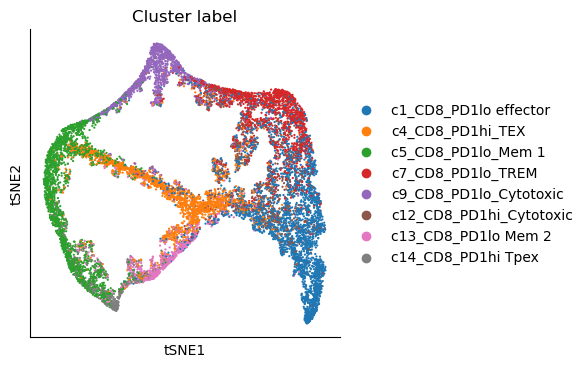

In [7]:
# Compute a visualisation based on the Palantir components
scp.tl.tsne(adata, n_pcs=2, use_rep="X_palantir_multiscale", perplexity=150)
scp.pl.tsne(adata, color="Cluster label")

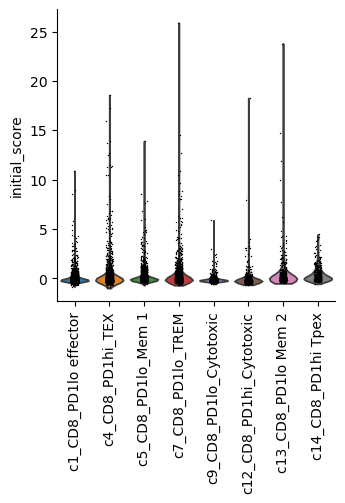

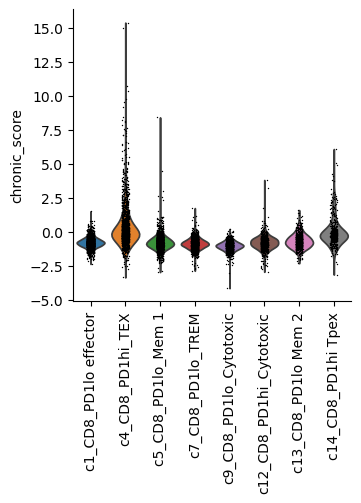

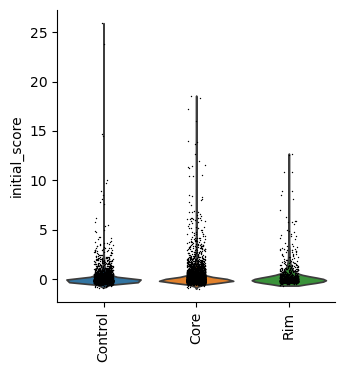

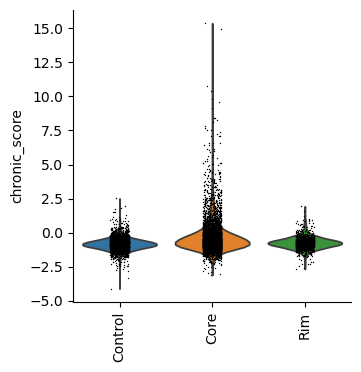

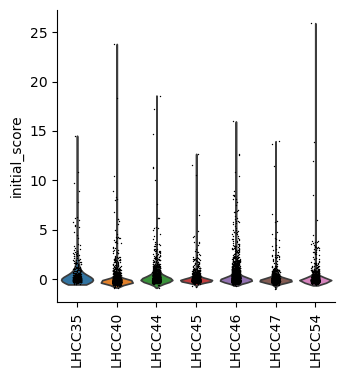

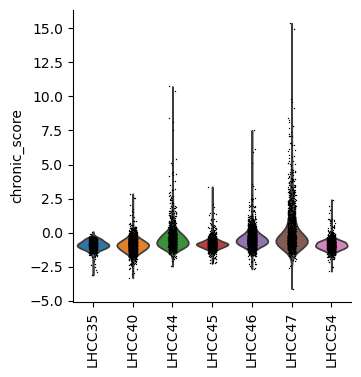

In [49]:
# Score cells according to gene expression to help select initial cells
scp.tl.score_genes(
    adata,
    gene_list=[
        "IL6ST",
        "CD160",
        "CD200",
        "BTLA",
        "GNG4",
        "XCL1",
        "XCL2",
    ],
    score_name="initial_score",
)

scp.tl.score_genes(
    adata,
    gene_list=[
        "PDCD1",
        "LAG3",
        "CTLA4",
        "HAVCR2",
        "ENTPD1",
        "TIGIT",
        "CD38",
        "DUSP4",
        "TOX2",
        "LAYN",
        "CXCL13",
    ],
    score_name="chronic_score",
)

scp.pl.violin(adata, keys="initial_score", groupby="Cluster label", rotation=90)
scp.pl.violin(adata, keys="chronic_score", groupby="Cluster label", rotation=90)

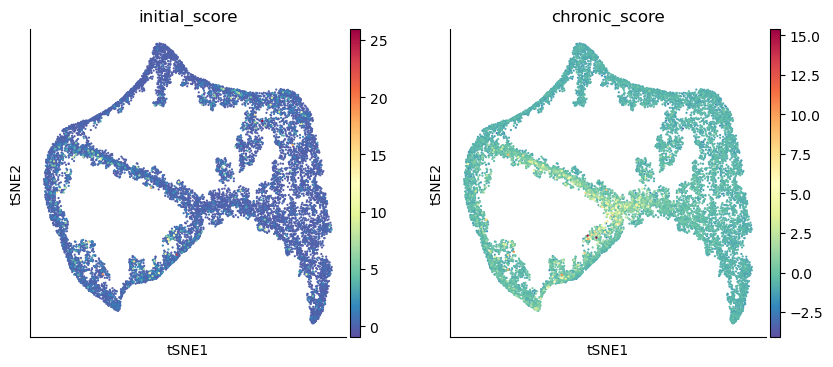

In [11]:
scp.pl.tsne(
    adata,
    color=["initial_score", "chronic_score"],
    ncols=2,
)

c14_CD8_PD1hi Tpex


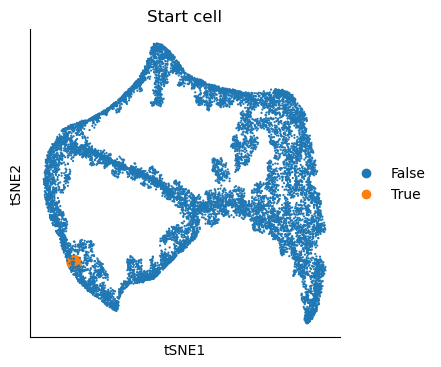

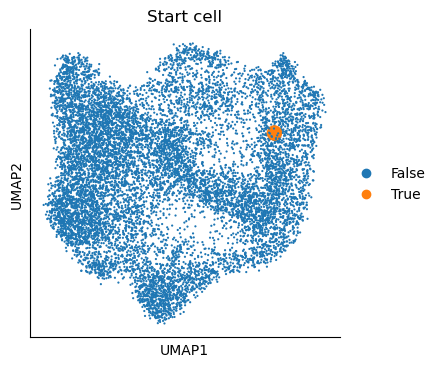

In [50]:
# Select cell in Tpex cluster
start_cell = np.argmax(
    adata[adata.obs["Cluster label"] == "c14_CD8_PD1hi Tpex"].obs["initial_score"]
)
start_cell = adata[adata.obs["Cluster label"] == "c14_CD8_PD1hi Tpex"].obs.index[
    start_cell
]

print(adata.obs.loc[start_cell, "Cluster label"])

adata.obs["Start cell"] = adata.obs.index == start_cell

scp.pl.tsne(
    adata,
    color="Start cell",
    ncols=1,
    size=[500 if s else 10 for s in adata.obs["Start cell"]],
)

scp.pl.umap(
    adata,
    color="Start cell",
    ncols=1,
    size=[500 if s else 10 for s in adata.obs["Start cell"]],
)

c7_CD8_PD1lo_TREM


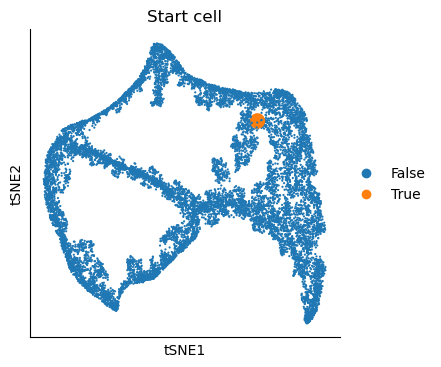

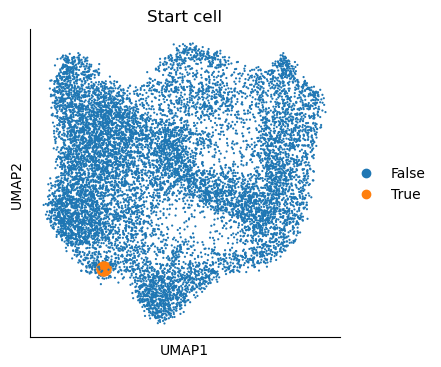

In [13]:
# Select cell in all clusters (results in a TREM cell)
start_cell = np.argmax(adata.obs["initial_score"])
start_cell = adata.obs.index[start_cell]
print(adata.obs.loc[start_cell, "Cluster label"])

adata.obs["Start cell"] = adata.obs.index == start_cell

scp.pl.tsne(
    adata,
    color="Start cell",
    ncols=1,
    size=[500 if s else 10 for s in adata.obs["Start cell"]],
)

scp.pl.umap(
    adata,
    color="Start cell",
    ncols=1,
    size=[500 if s else 10 for s in adata.obs["Start cell"]],
)

In [51]:
# Use Palantir diffusion components and selected start cell to determine pseudotime and branches
pr_res = scp.external.tl.palantir_results(
    adata,
    early_cell=start_cell,
    ms_data="X_palantir_multiscale",
    use_early_cell_as_start=True,
)

Sampling and flocking waypoints...
Time for determining waypoints: 0.066082763671875 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...
Time for shortest paths: 0.3924018661181132 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 0.9990
Correlation at iteration 2: 0.9999
Entropy and branch probabilities...
Markov chain construction...
Identification of terminal states...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...


In [52]:
# Save palantir results in adata object
adata.obs["palantir_pseudotime"] = pr_res.pseudotime
adata.obsm["palantir_fate_probabilities"] = pr_res.branch_probs

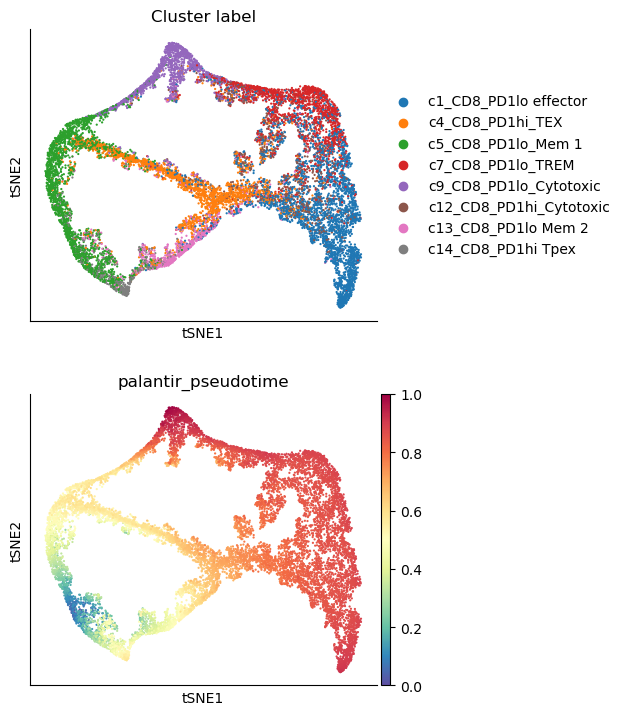

In [53]:
scp.pl.tsne(adata, color=["Cluster label", "palantir_pseudotime"], ncols=1)

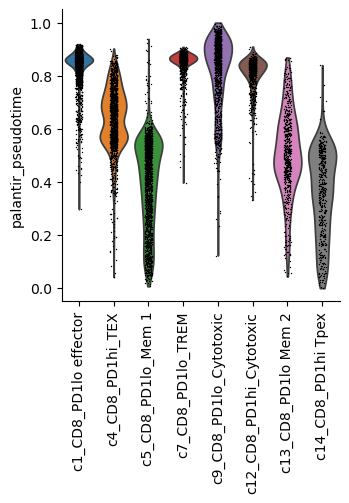

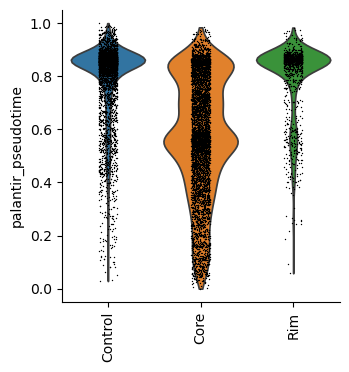

In [54]:
scp.pl.violin(adata, keys=["palantir_pseudotime"], groupby="Cluster label", rotation=90)
scp.pl.violin(adata, keys=["palantir_pseudotime"], groupby="Tissue", rotation=90)

In [55]:
cluster_index = [x.split("_")[0] for x in list(adata.obs["Cluster label"].unique())]
cluster_index = [int(x[1:]) for x in cluster_index]
cluster_index = np.argsort(cluster_index)
color_dict = {}
for color, cluster in zip(
    adata.uns["Cluster label_colors"],
    adata.obs["Cluster label"].unique()[cluster_index],
):
    color_dict[cluster] = color

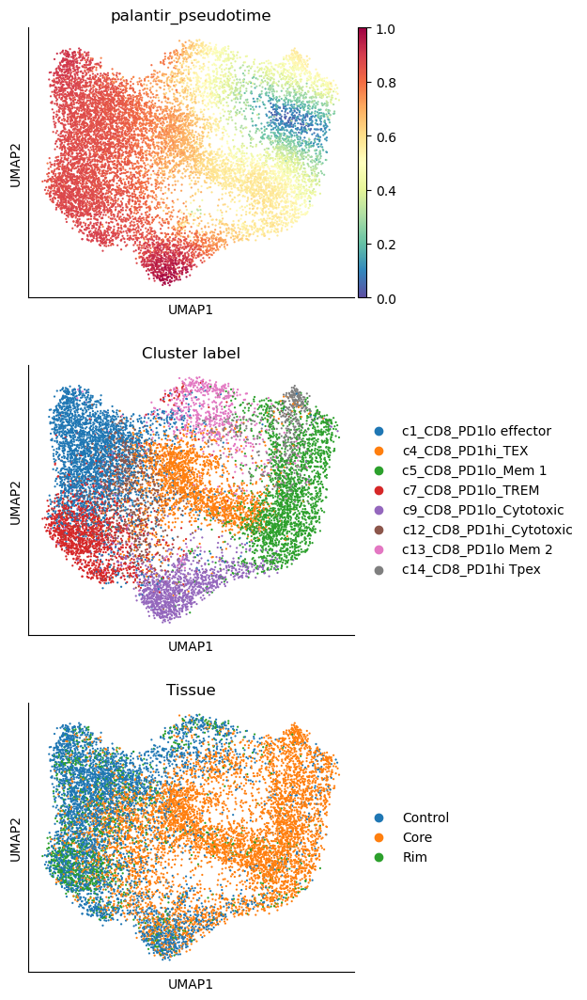

In [56]:
scp.pl.umap(adata, color=["palantir_pseudotime", "Cluster label", "Tissue"], ncols=1)

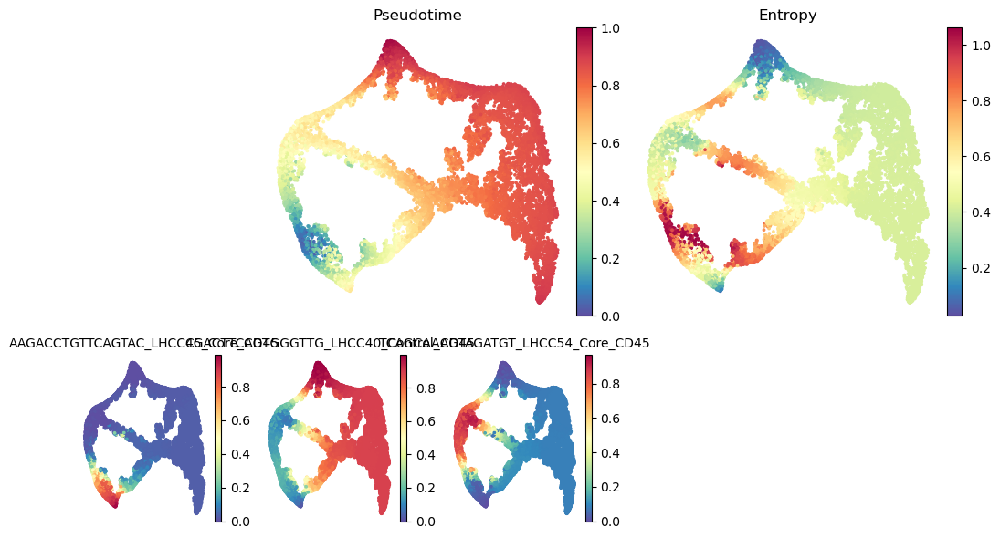

In [57]:
palantir.plot.plot_palantir_results(adata, pr_res, s=3, embedding_basis="X_tsne")
plt.show()

In [58]:
masks = palantir.presults.select_branch_cells(adata, q=0.01, eps=0.01)

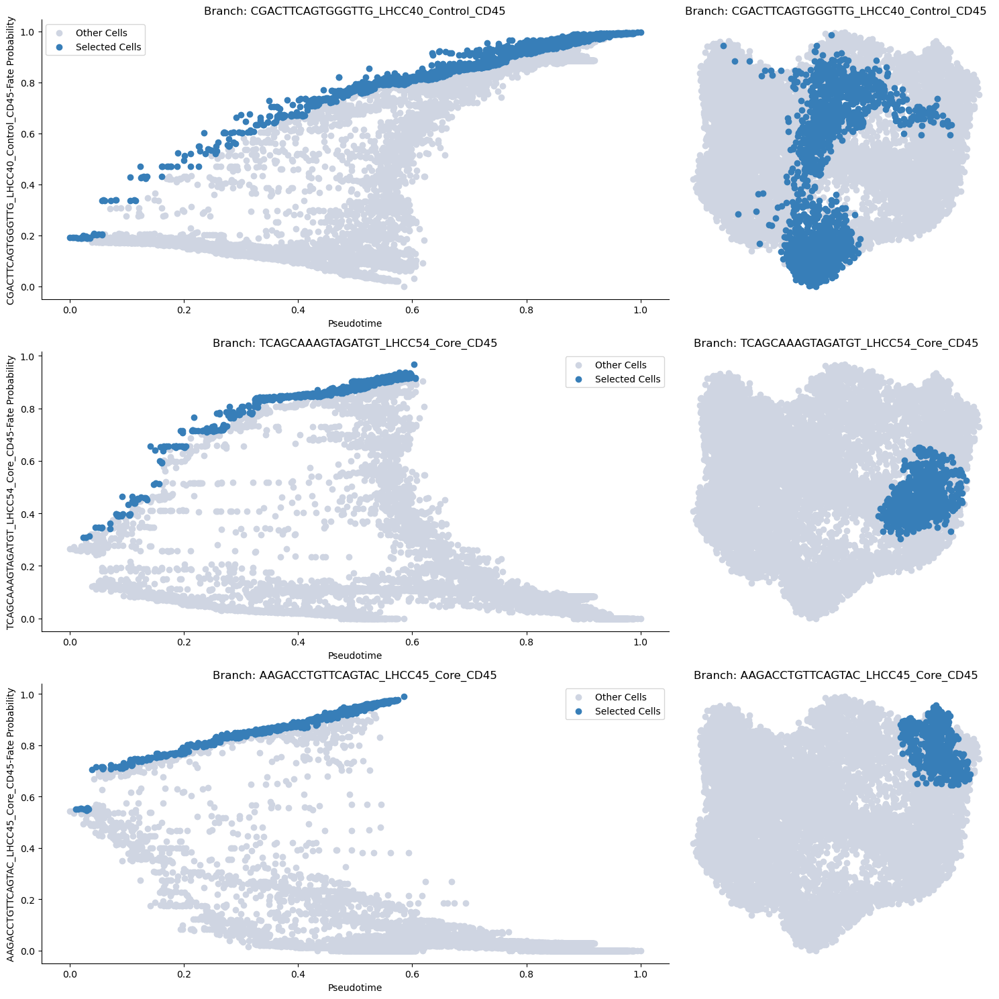

In [59]:
palantir.plot.plot_branch_selection(adata)
plt.show()

In [60]:
traj_dict = {}
for trajectory in adata.obsm["branch_masks"].columns:
    traj_dict[trajectory] = (
        adata.obs.loc[trajectory]["Cluster label"]
        + "_"
        + adata.obs.loc[trajectory]["Tissue"]
    )

adata.obsm["branch_masks"].rename(
    columns=traj_dict,
    inplace=True,
)

adata.obsm["palantir_fate_probabilities"].rename(
    columns=traj_dict,
    inplace=True,
)

[2025-09-29 06:59:08,013] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (468) and rank = 1.0.
[2025-09-29 06:59:08,014] [INFO    ] Using covariance function Matern52(ls=0.7902713775634765).
[2025-09-29 06:59:08,036] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-09-29 06:59:08,364] [INFO    ] Sigma interpreted as element-wise standard deviation.


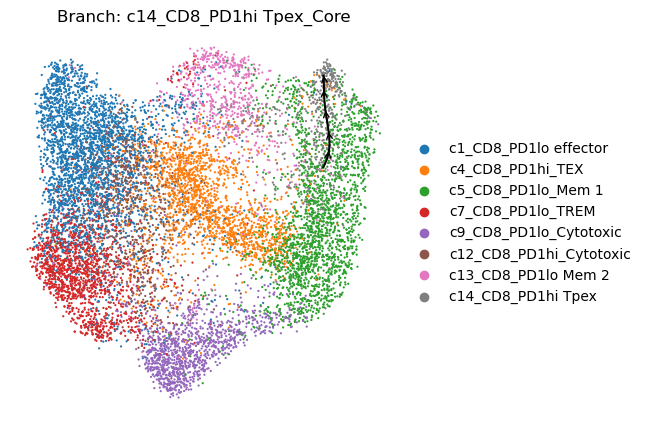

[2025-09-29 06:59:08,691] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (468) and rank = 1.0.
[2025-09-29 06:59:08,692] [INFO    ] Using covariance function Matern52(ls=0.7902713775634765).
[2025-09-29 06:59:08,693] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-09-29 06:59:08,708] [INFO    ] Sigma interpreted as element-wise standard deviation.
[2025-09-29 06:59:08,756] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (1,881) and rank = 1.0.
[2025-09-29 06:59:08,756] [INFO    ] Using covariance function Matern52(ls=0.7902713775634765).
[2025-09-29 06:59:08,777] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-09-29 06:59:09,147] [INFO    ] Sigma interpreted as element-wise standard deviation.


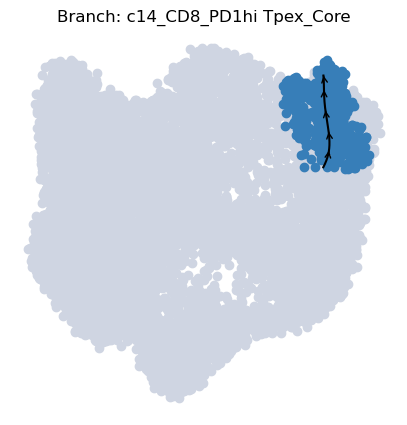

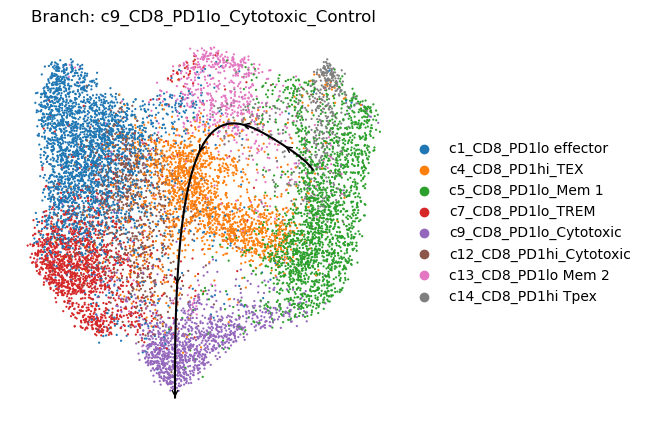

[2025-09-29 06:59:09,539] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (1,881) and rank = 1.0.
[2025-09-29 06:59:09,540] [INFO    ] Using covariance function Matern52(ls=0.7902713775634765).
[2025-09-29 06:59:09,541] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-09-29 06:59:09,561] [INFO    ] Sigma interpreted as element-wise standard deviation.
[2025-09-29 06:59:10,065] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (817) and rank = 1.0.
[2025-09-29 06:59:10,066] [INFO    ] Using covariance function Matern52(ls=0.7902713775634765).
[2025-09-29 06:59:10,088] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-09-29 06:59:10,429] [INFO    ] Sigma interpreted as element-wise standard deviation.


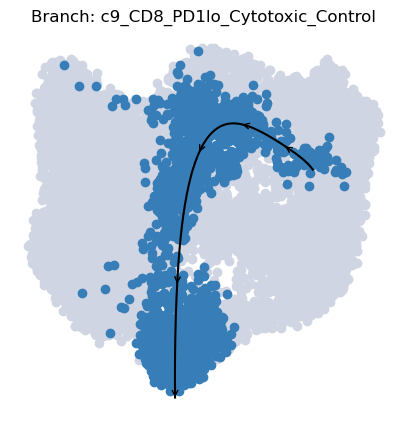

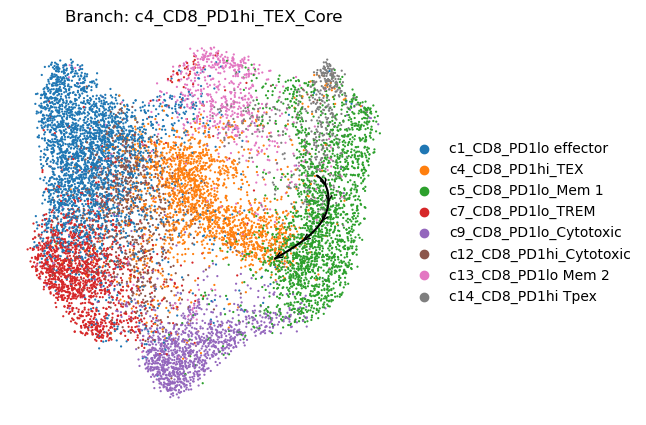

[2025-09-29 06:59:10,822] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (817) and rank = 1.0.
[2025-09-29 06:59:10,823] [INFO    ] Using covariance function Matern52(ls=0.7902713775634765).
[2025-09-29 06:59:10,824] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-09-29 06:59:10,840] [INFO    ] Sigma interpreted as element-wise standard deviation.


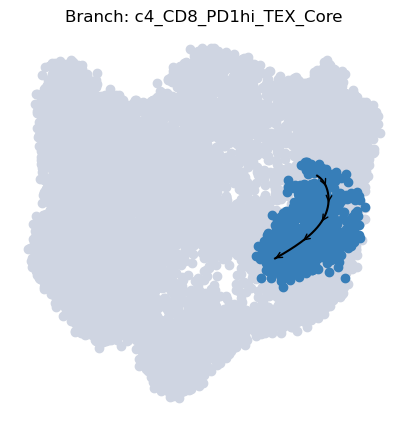

In [61]:
for trajectory in adata.obsm["branch_masks"].columns:
    palantir.plot.plot_trajectory(adata, trajectory, cell_color="Cluster label")

    plt.show()

    palantir.plot.plot_trajectory(adata, trajectory)
    plt.show

    scp.pl

In [62]:
for column in adata.obsm["palantir_fate_probabilities"].columns:
    adata.obs[column + "_fate_prob"] = adata.obsm["palantir_fate_probabilities"][column]

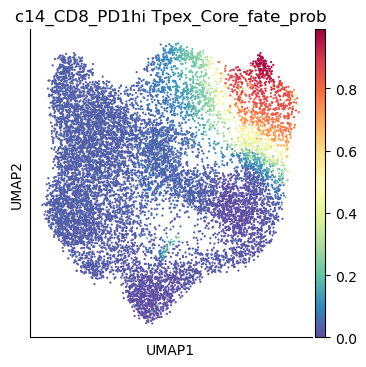

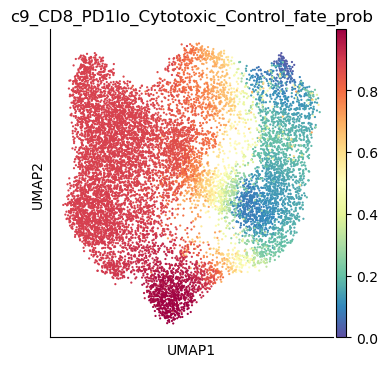

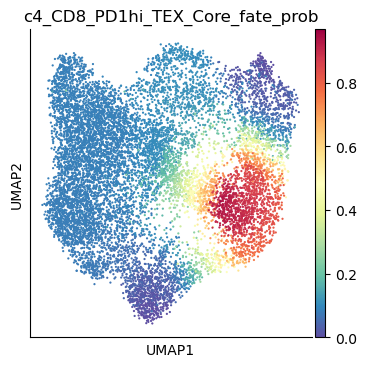

In [63]:
for column in adata.obsm["palantir_fate_probabilities"].columns:
    scp.pl.umap(adata, color=column + "_fate_prob")

In [65]:
adata.write("adata_palantir_tpex.h5ad")

c14_CD8_PD1hi Tpex_Core


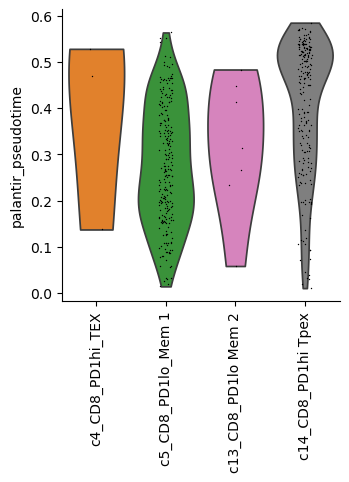

c9_CD8_PD1lo_Cytotoxic_Control


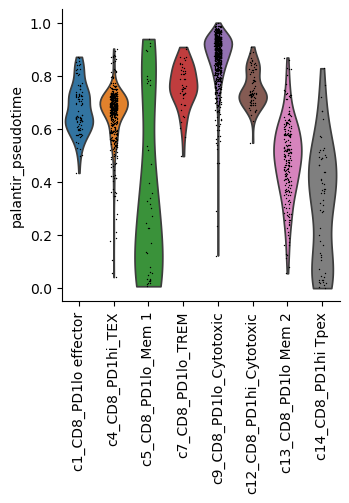

c4_CD8_PD1hi_TEX_Core


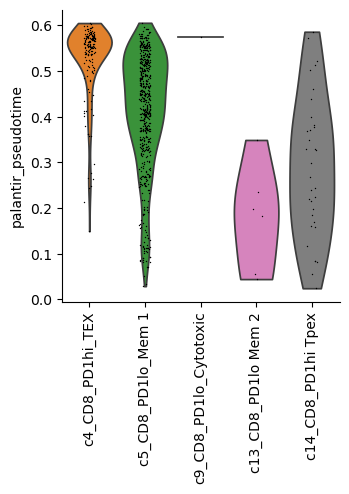

In [64]:
for branch in adata.obsm["branch_masks"].columns:
    print(branch)
    scp.pl.violin(
        adata[adata.obsm["branch_masks"][branch]],
        keys=["palantir_pseudotime"],
        groupby="Cluster label",
        rotation=90,
    )

In [156]:
adata.obs["branch_assignment"] = "None"

for branch in adata.obsm["branch_masks"].columns:
    adata.obs.loc[adata.obsm["branch_masks"][branch], "branch_assignment"] = branch

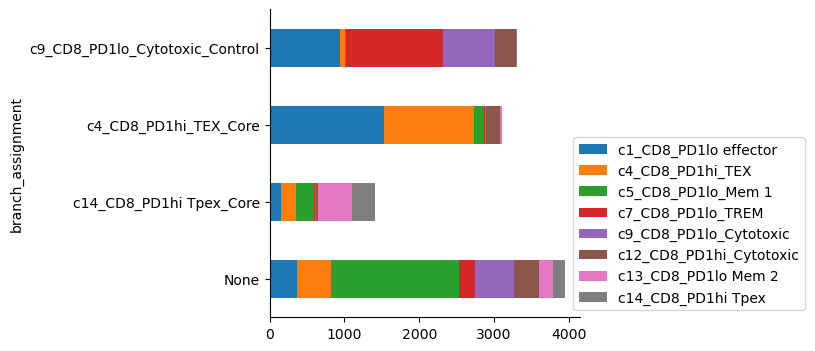

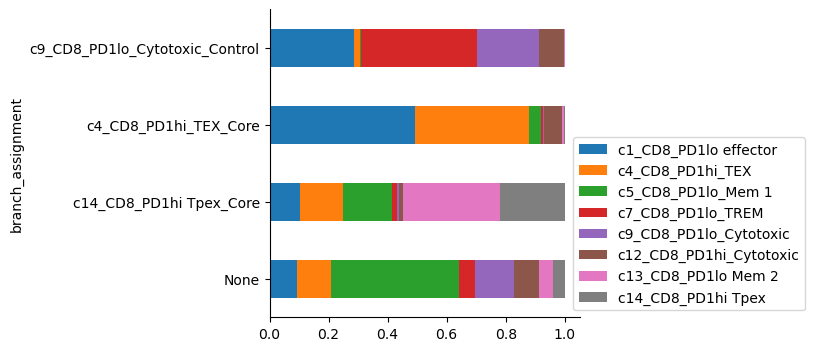

In [157]:
count_df_ = (
    adata.obs.value_counts(["branch_assignment", "Cluster label"])
    .reset_index()
    .pivot(index="branch_assignment", columns="Cluster label", values="count")
).fillna(0)
count_df_.plot.barh(stacked=True)
plt.legend(bbox_to_anchor=(1.75, 0), loc="lower right")
plt.show()

count_df__norm = count_df_.div(count_df_.sum(axis=1), axis=0)
count_df__norm = count_df_.div(count_df_.sum(axis=1), axis=0)
count_df__norm.plot.barh(stacked=True)
plt.legend(bbox_to_anchor=(1.75, 0), loc="lower right")
plt.show()

In [27]:
def pst_analysis(
    adata,
    clonotype=None,
    start_cluster="c1_CD8_PD1lo effector",
    plot=False,
    clonotype_column="Clonotype",
    embedding_key="X_umap",
    end_clusters=None,
):

    # select only given clonotype
    if clonotype != None:
        right_clonotype = [
            True if clonotype == adata.obs.loc[idx, clonotype_column] else False
            for idx in adata.obs.index.values
        ]
        adata = adata[right_clonotype]

    knn = max(len(adata) // 6, 3)
    scp.external.tl.palantir(adata, n_components=5, knn=knn)

    dm_res = palantir.utils.run_diffusion_maps(adata, n_components=5, knn=knn)
    ms_data = palantir.utils.determine_multiscale_space(adata)
    imputed_X = palantir.utils.run_magic_imputation(adata)

    start_cells = np.argwhere(
        (adata.obs["Cluster label"] == start_cluster).values
        # & (adata.obs["leiden"] == "0").values
    ).flatten()

    if len(start_cells) == 0:
        return None

    # start_cell = adata.obs.index[start_cells[0]]

    start_cell = palantir.utils.early_cell(
        adata, start_cluster, celltype_column="Cluster label", fallback_seed=0
    )

    term_states = None

    if end_clusters is not None:

        actual_end_clusters = []

        for c in end_clusters:
            if c in adata.obs["Cluster label"].unique():
                actual_end_clusters.append(c)

        # print(actual_end_clusters)
        # print(term_states)

        if len(actual_end_clusters) > 0:
            term_states = palantir.utils.find_terminal_states(
                adata, actual_end_clusters, celltype_column="Cluster label"
            )

    pr_res = scp.external.tl.palantir_results(
        adata,
        knn=knn,
        early_cell=start_cell,
        terminal_states=term_states,
        ms_data="X_palantir_multiscale",
        num_waypoints=500,
    )

    adata.obs["palantir_pseudotime"] = pr_res.pseudotime
    adata.obsm["palantir_fate_probabilities"] = pr_res.branch_probs

    if pr_res.branch_probs.values.shape[1] != 0:  # if identified branches
        masks = palantir.presults.select_branch_cells(adata, q=0.02, eps=0.02)

    if plot:

        # palantir.plot.plot_palantir_results(adata, pr_res, s=3)
        # plt.show()

        scp.pl.umap(adata, color=["palantir_pseudotime"], size=50, legend_loc="best")
        plt.show()

        if pr_res.branch_probs.values.shape[1] != 0:
            print(f"Found {pr_res.branch_probs.values.shape[1]} trajectories")
            # palantir.plot.plot_trajectories is not available in this version

            traj_dict = {}
            for trajectory in adata.obsm["branch_masks"].columns:
                traj_dict[trajectory] = (
                    adata.obs.loc[trajectory]["Cluster label"]
                    + "_"
                    + adata.obs.loc[trajectory]["Tissue"]
                )

            adata.obsm["branch_masks"].rename(
                columns=traj_dict,
                inplace=True,
            )

            adata.obsm["palantir_fate_probabilities"].rename(
                columns=traj_dict,
                inplace=True,
            )

            palantir.plot.plot_branch_selection(adata)
            plt.show()

            for trajectory in adata.obsm["branch_masks"].columns:
                palantir.plot.plot_trajectory(
                    adata, trajectory, cell_color="Cluster label"
                )

                plt.show()

                palantir.plot.plot_trajectory(adata, trajectory)
                plt.show

        fig, axes = plt.subplots(ncols=2, nrows=1, figsize=(16, 6))

        scp.pl.violin(
            adata,
            keys=["palantir_pseudotime"],
            groupby="Cluster label",
            rotation=90,
            ax=axes[0],
            show=False,
        )

        scp.pl.violin(
            adata,
            keys=["palantir_pseudotime"],
            groupby="Tissue",
            rotation=90,
            ax=axes[1],
            show=False,
        )

        fig.show()

    return pr_res

In [28]:
top_clonal_counts = adata.obs["Clonotype"].value_counts(ascending=False)
top_clonal_counts = top_clonal_counts[1:]  # skip 'X' - no clonotype
top_clonal_counts

adata.obs["Palantir pst indiviudal"] = pd.Series(
    [None] * len(adata.obs.index), index=adata.obs.index, dtype=np.float
)

processed = []
for clonotype in top_clonal_counts.index[:80]:
    print(f"Starting {clonotype}")
    try:

        pl_res = pst_analysis(
            adata,
            clonotype=clonotype,
            start_cluster="c1_CD8_PD1lo effector",
            plot=True,
            clonotype_column="Clonotype",
            end_clusters=[
                "c4_CD8_PD1hi_TEX",
                "c5_CD8_PD1lo_Mem 1",
                "c13_CD8_PD1lo Mem 2",
            ],
        )

        if pl_res is None:
            print("No effectors in cluster")
        else:
            adata.obs.loc[pl_res.pseudotime.index, "Palantir pst indiviudal"] = (
                pl_res.pseudotime
            )
            processed.append(clonotype)
    except:
        print(f"Skipped {clonotype}")
        continue


print(processed)

KeyError: 'Clonotype'

/home/ubuntu/miniconda3/envs/barbu_env_cr/lib/python3.9/site-packages/scanpy/external/tl/_palantir.py:243: ImplicitModificationWarning: Setting element `.layers['palantir_imp']` of view, initializing view as actual.
  adata.layers["palantir_imp"] = imp_df


Using AGCTCCTCAGACGTAG_LHCC40_Control_CD45 for cell type c1_CD8_PD1lo effector which is max in diffusion component 0.
Using CCGTGGACACCCATTC_LHCC40_Core_CD45 for cell type c5_CD8_PD1lo_Mem 1 which is min in diffusion component 0.
Sampling and flocking waypoints...
Time for determining waypoints: 0.00020769437154134114 minutes
Determining pseudotime...
Shortest path distances using 15-nearest neighbor graph...


/home/ubuntu/miniconda3/envs/barbu_env_cr/lib/python3.9/site-packages/palantir/utils.py:1030: UserWarning: No valid component found: c4_CD8_PD1hi_TEX Consider increasing the number of diffusion components ('n_components' in palantir.utils.run_diffusion_maps). The cell type c4_CD8_PD1hi_TEX will be skipped.
  warn(


Time for shortest paths: 0.1627506415049235 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 0.9997
Correlation at iteration 2: 0.9999
Entropy and branch probabilities...
Markov chain construction...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...


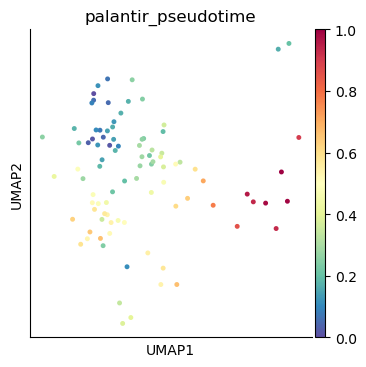

Found 1 trajectories


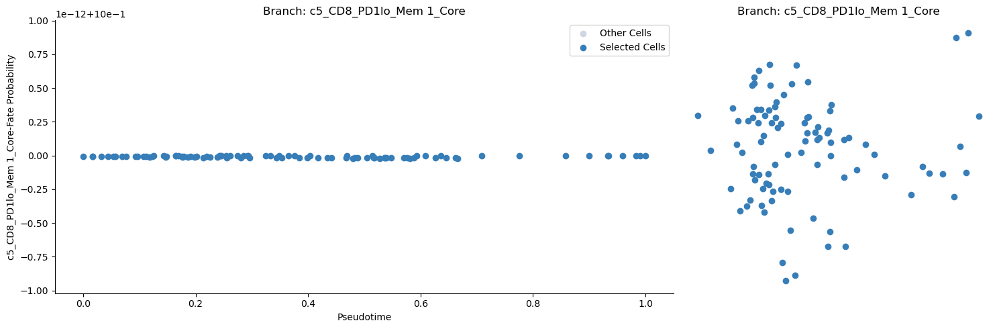

[2025-05-07 07:49:06,649] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (93) and rank = 1.0.
[2025-05-07 07:49:06,650] [INFO    ] Using covariance function Matern52(ls=0.6808708667755127).
[2025-05-07 07:49:06,651] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-05-07 07:49:06,667] [INFO    ] Sigma interpreted as element-wise standard deviation.


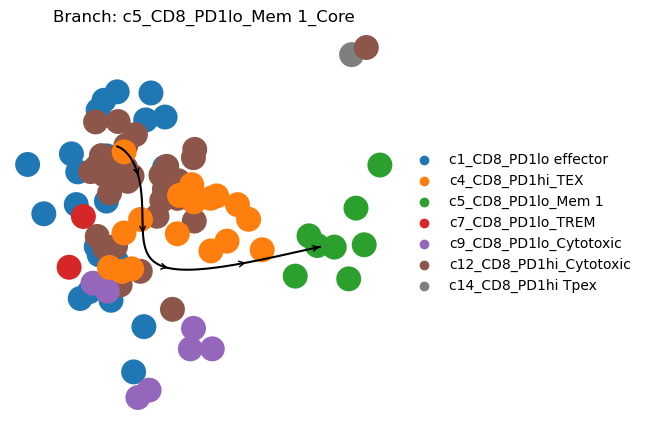

[2025-05-07 07:49:06,876] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (93) and rank = 1.0.
[2025-05-07 07:49:06,876] [INFO    ] Using covariance function Matern52(ls=0.6808708667755127).
[2025-05-07 07:49:06,877] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-05-07 07:49:06,891] [INFO    ] Sigma interpreted as element-wise standard deviation.


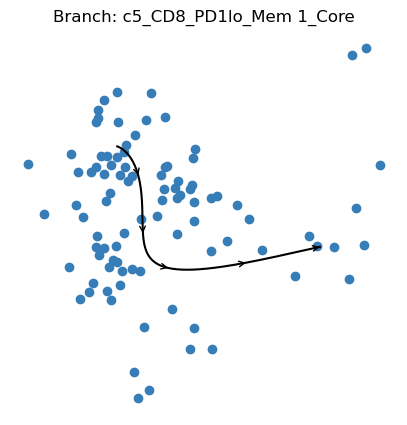

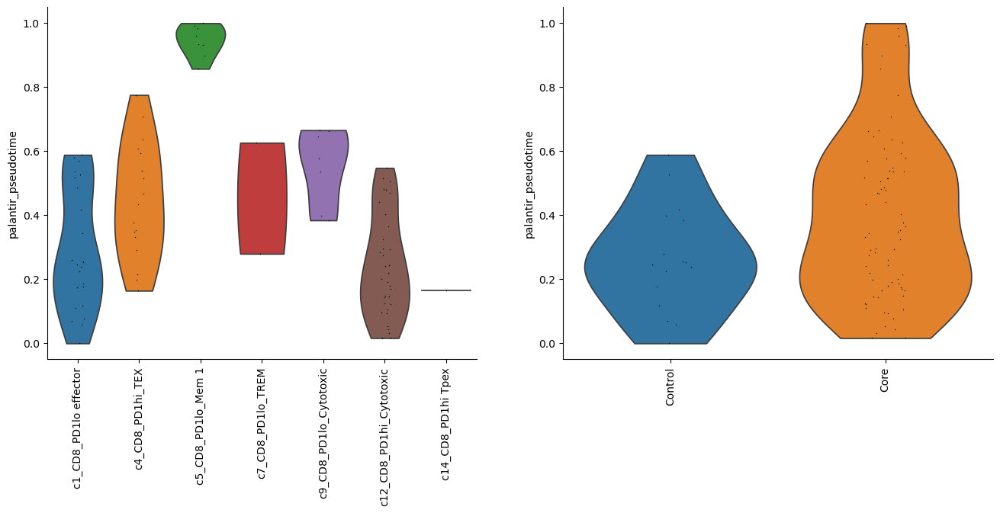

In [28]:
pl_res = pst_analysis(
    adata,
    clonotype="906",
    start_cluster="c1_CD8_PD1lo effector",
    plot=True,
    clonotype_column="Clonotype",
    end_clusters=["c4_CD8_PD1hi_TEX", "c5_CD8_PD1lo_Mem 1", "c13_CD8_PD1lo Mem 2"],
)

In [29]:
len(processed)

38

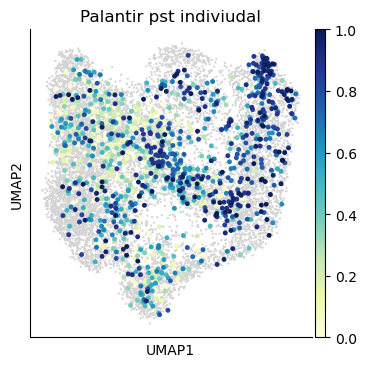

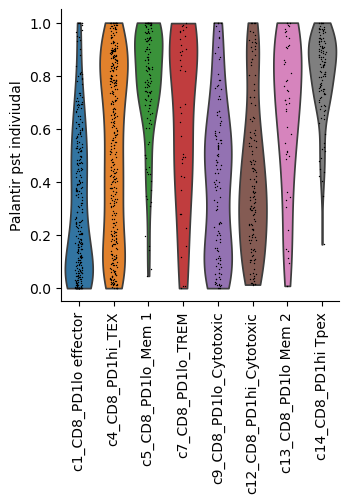

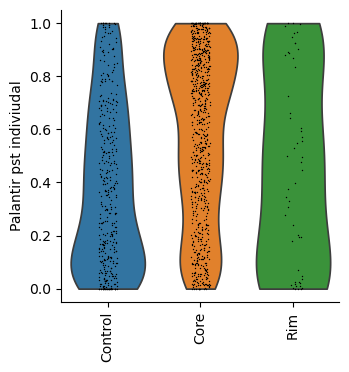

In [30]:
has_pst = adata.obs["Palantir pst indiviudal"].notnull()

size = [50 if x else 10 for x in has_pst]
scp.pl.umap(
    adata,
    color=["Palantir pst indiviudal"],
    size=size,
    cmap="YlGnBu",
    legend_loc="right margin",
    ncols=1,
)

scp.pl.violin(
    adata[has_pst],
    keys=["Palantir pst indiviudal"],
    groupby="Cluster label",
    rotation=90,
)

scp.pl.violin(
    adata[has_pst], keys=["Palantir pst indiviudal"], groupby="Tissue", rotation=90
)

In [31]:
has_pst.sum()

1210

In [32]:
adata.obs["Palantir pst indiviudal"].to_csv("CD8_individual_palantir_pseudotime.csv")

In [33]:
cells_looked_at = 0
for clonotype in top_clonal_counts.index:
    cells_in_clono = adata[adata.obs["Clonotype cluster"] == clonotype]
    if "c1_CD8_PD1lo effector" in cells_in_clono.obs["Cluster label"].unique():

        cells_looked_at += len(cells_in_clono)
cells_looked_at

2004

In [34]:
cells_looked_at

2004

In [35]:
(adata.obs["Clonotype cluster"] != "X").sum()

4962

/home/ubuntu/miniconda3/envs/barbu_env_cr/lib/python3.9/site-packages/scanpy/external/tl/_palantir.py:243: ImplicitModificationWarning: Setting element `.layers['palantir_imp']` of view, initializing view as actual.
  adata.layers["palantir_imp"] = imp_df


No effectors in cluster


/home/ubuntu/miniconda3/envs/barbu_env_cr/lib/python3.9/site-packages/scanpy/external/tl/_palantir.py:243: ImplicitModificationWarning: Setting element `.layers['palantir_imp']` of view, initializing view as actual.
  adata.layers["palantir_imp"] = imp_df


Falling back to slow early cell detection.
Sampling and flocking waypoints...
Time for determining waypoints: 0.0006624937057495117 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...
Time for shortest paths: 0.1602482517560323 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 0.9998
Correlation at iteration 2: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Identification of terminal states...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...
Using ACGCAGCTCCGCGGTA_LHCC46_Core_CD45 for cell type c1_CD8_PD1lo effector which is latest cell in c1_CD8_PD1lo effector when starting from CCTCTGAGTGTGACCC_LHCC46_Rim_CD45.
Sampling and flocking waypoints...
Time for determining waypoints: 0.00037027994791666665 minutes
Determining pseudotime...
Shortest path distances using 23-nearest neighbor graph...
Time for shortest paths: 0.003928701082865397 minutes
Iterati

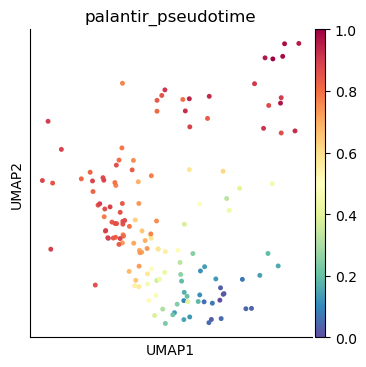

Found 2 trajectories


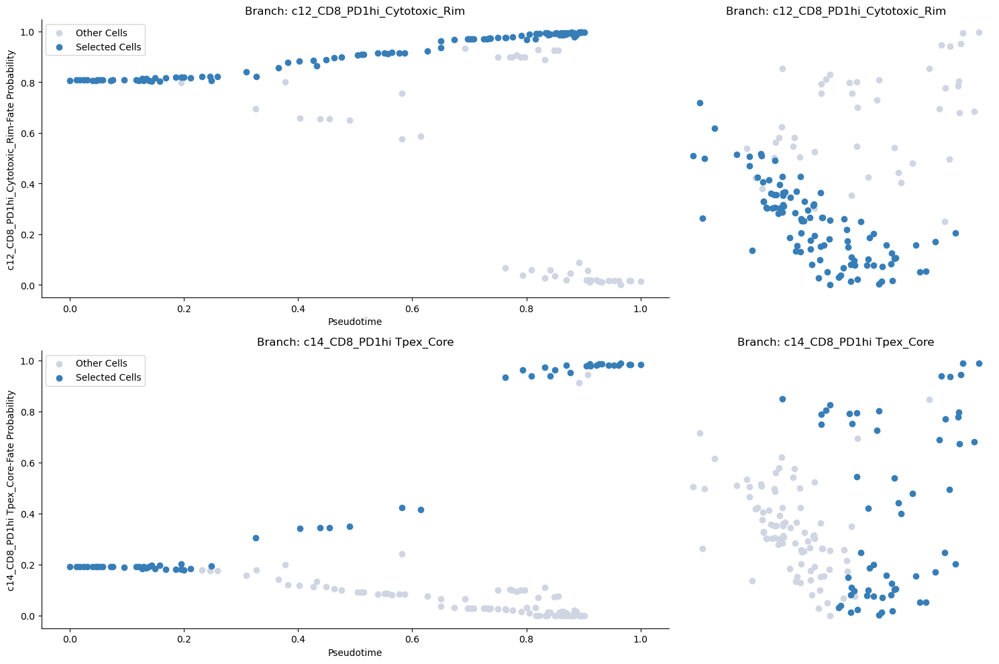

[2025-05-07 07:49:40,079] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (99) and rank = 1.0.
[2025-05-07 07:49:40,080] [INFO    ] Using covariance function Matern52(ls=0.48194541931152346).
[2025-05-07 07:49:40,101] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-05-07 07:49:40,422] [INFO    ] Sigma interpreted as element-wise standard deviation.


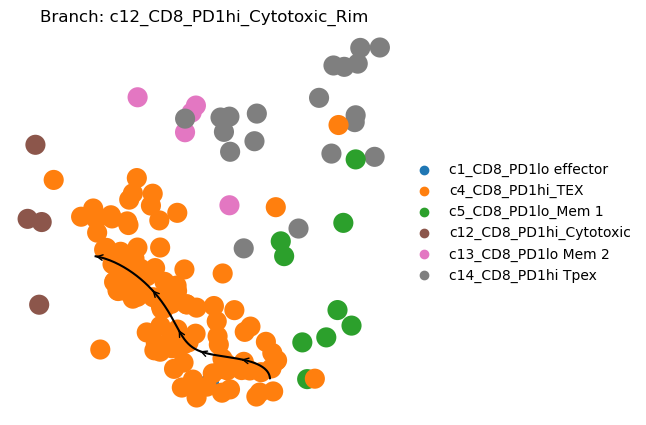

[2025-05-07 07:49:40,662] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (99) and rank = 1.0.
[2025-05-07 07:49:40,662] [INFO    ] Using covariance function Matern52(ls=0.48194541931152346).
[2025-05-07 07:49:40,663] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-05-07 07:49:40,677] [INFO    ] Sigma interpreted as element-wise standard deviation.
[2025-05-07 07:49:40,724] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (57) and rank = 1.0.
[2025-05-07 07:49:40,725] [INFO    ] Using covariance function Matern52(ls=0.48194541931152346).
[2025-05-07 07:49:40,748] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-05-07 07:49:41,060] [INFO    ] Sigma interpreted as element-wise standard deviation.


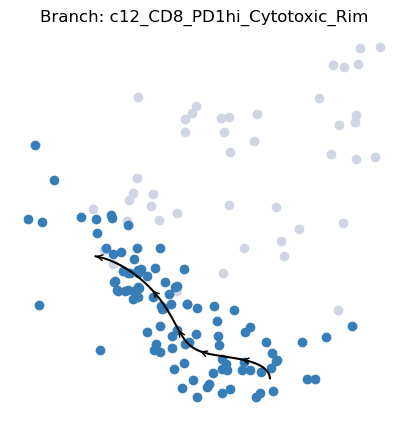

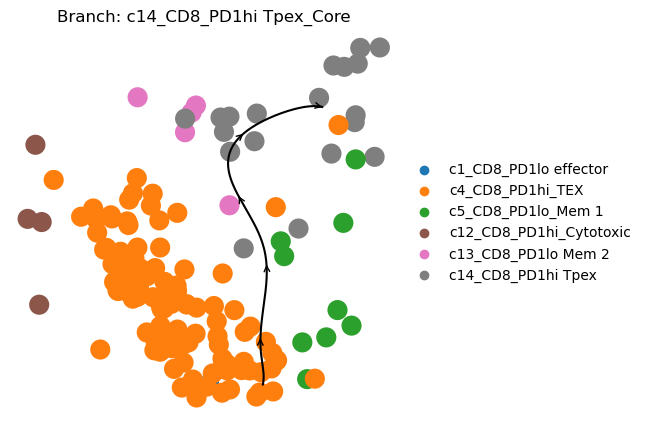

[2025-05-07 07:49:41,342] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (57) and rank = 1.0.
[2025-05-07 07:49:41,343] [INFO    ] Using covariance function Matern52(ls=0.48194541931152346).
[2025-05-07 07:49:41,344] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-05-07 07:49:41,356] [INFO    ] Sigma interpreted as element-wise standard deviation.


/home/ubuntu/miniconda3/envs/barbu_env_cr/lib/python3.9/site-packages/scanpy/external/tl/_palantir.py:243: ImplicitModificationWarning: Setting element `.layers['palantir_imp']` of view, initializing view as actual.
  adata.layers["palantir_imp"] = imp_df


Using AGCTCCTCAGACGTAG_LHCC40_Control_CD45 for cell type c1_CD8_PD1lo effector which is max in diffusion component 0.
Sampling and flocking waypoints...
Time for determining waypoints: 0.00021175146102905273 minutes
Determining pseudotime...
Shortest path distances using 15-nearest neighbor graph...
Time for shortest paths: 0.16278826395670573 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 0.9997
Correlation at iteration 2: 0.9999
Entropy and branch probabilities...
Markov chain construction...
Identification of terminal states...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...


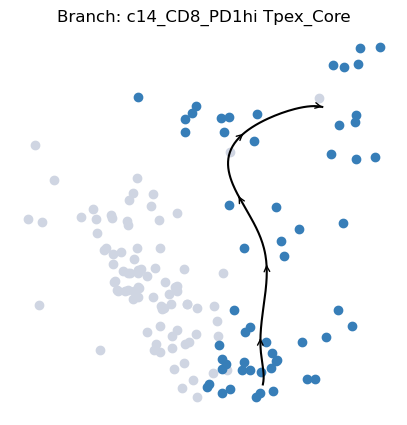

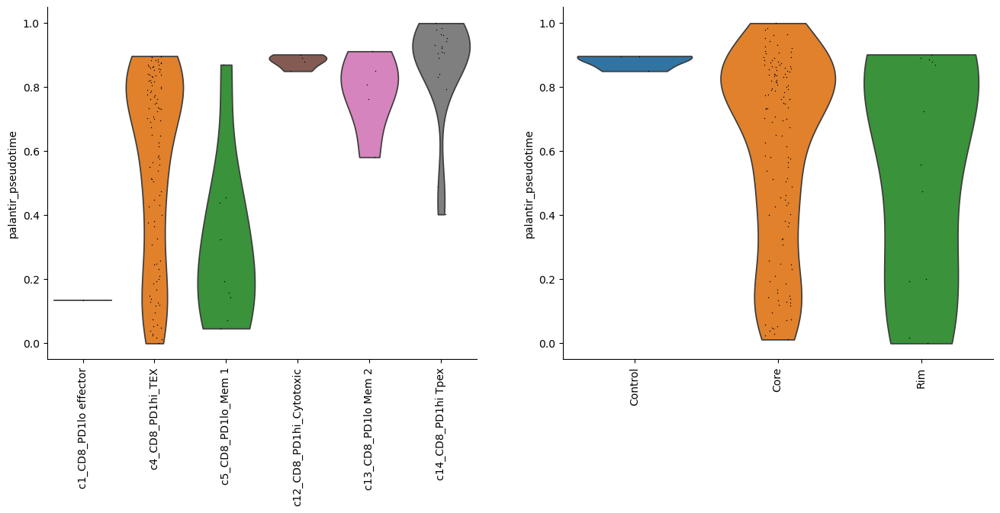

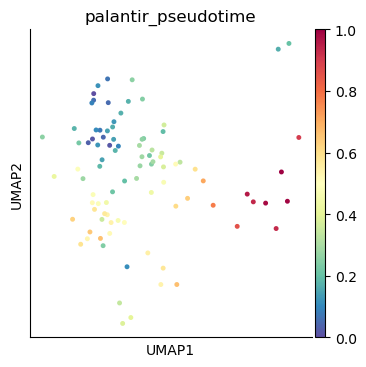

Found 2 trajectories


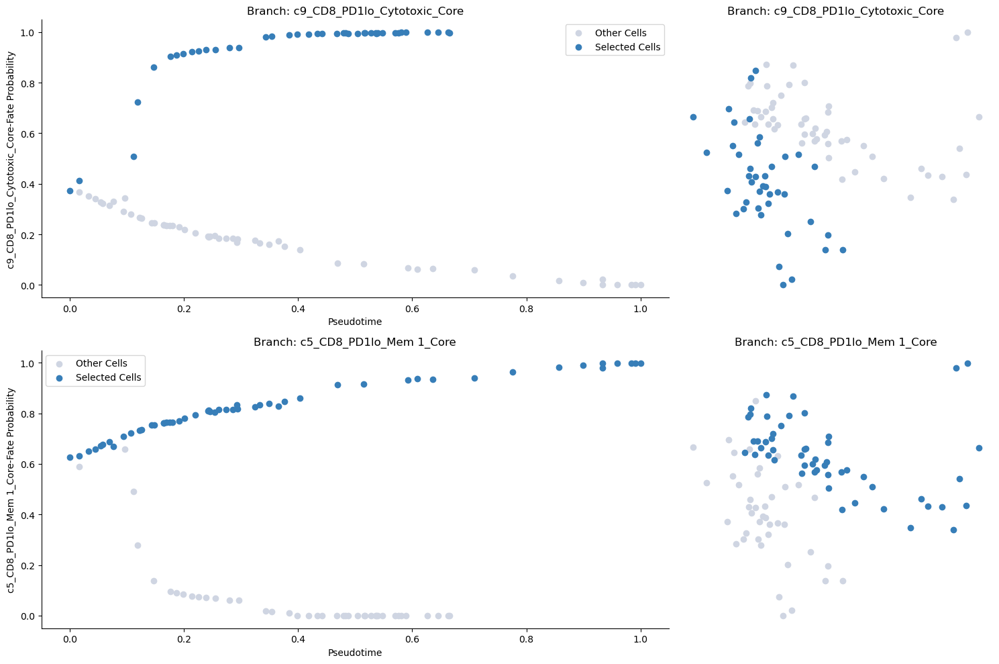

[2025-05-07 07:50:03,863] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (52) and rank = 1.0.
[2025-05-07 07:50:03,864] [INFO    ] Using covariance function Matern52(ls=0.6808708667755127).
[2025-05-07 07:50:03,886] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-05-07 07:50:04,190] [INFO    ] Sigma interpreted as element-wise standard deviation.


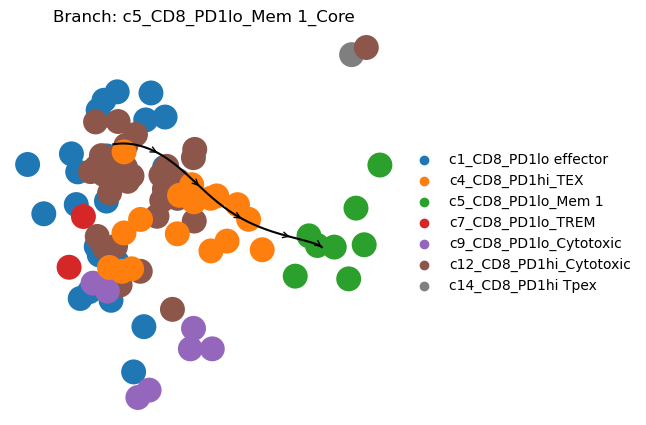

[2025-05-07 07:50:04,444] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (52) and rank = 1.0.
[2025-05-07 07:50:04,445] [INFO    ] Using covariance function Matern52(ls=0.6808708667755127).
[2025-05-07 07:50:04,445] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-05-07 07:50:04,458] [INFO    ] Sigma interpreted as element-wise standard deviation.
[2025-05-07 07:50:04,504] [INFO    ] Using non-sparse Gaussian Process since n_landmarks (50) >= n_samples (41) and rank = 1.0.
[2025-05-07 07:50:04,505] [INFO    ] Using covariance function Matern52(ls=0.6808708667755127).
[2025-05-07 07:50:04,527] [INFO    ] Recomputing covariance decomposition for predictive function.


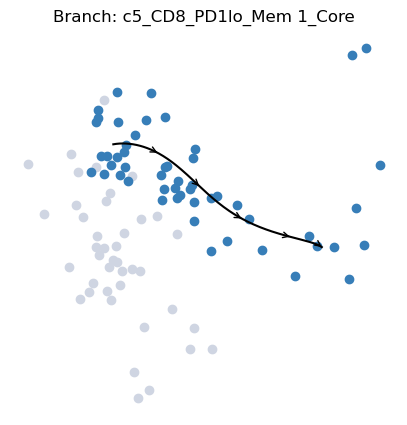

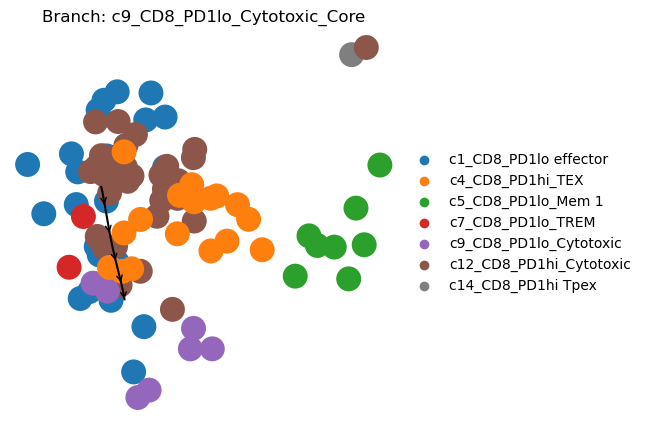

[2025-05-07 07:50:05,530] [INFO    ] Using non-sparse Gaussian Process since n_landmarks (50) >= n_samples (41) and rank = 1.0.
[2025-05-07 07:50:05,530] [INFO    ] Using covariance function Matern52(ls=0.6808708667755127).
[2025-05-07 07:50:05,531] [INFO    ] Recomputing covariance decomposition for predictive function.


/home/ubuntu/miniconda3/envs/barbu_env_cr/lib/python3.9/site-packages/scanpy/external/tl/_palantir.py:243: ImplicitModificationWarning: Setting element `.layers['palantir_imp']` of view, initializing view as actual.
  adata.layers["palantir_imp"] = imp_df


Falling back to slow early cell detection.
Sampling and flocking waypoints...
Time for determining waypoints: 0.00046286185582478844 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...
Time for shortest paths: 0.16373970111211142 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 0.9997
Correlation at iteration 2: 0.9999
Entropy and branch probabilities...
Markov chain construction...
Identification of terminal states...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...
Using GACTGCGGTCGAGTTT_LHCC44_Control_CD45 for cell type c1_CD8_PD1lo effector which is latest cell in c1_CD8_PD1lo effector when starting from GAATGAACAGGACGTA_LHCC44_Core_CD45.
Sampling and flocking waypoints...
Time for determining waypoints: 0.00025661389032999673 minutes
Determining pseudotime...
Shortest path distances using 14-nearest neighbor graph...
Time for shortest paths: 0.0023917357126871743 minutes


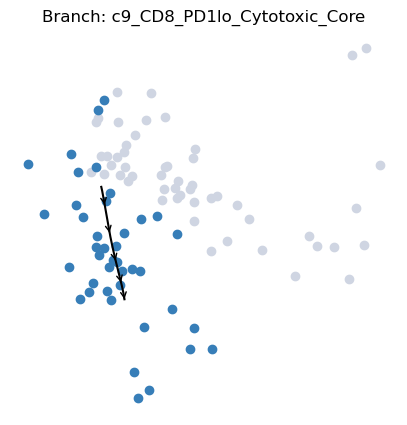

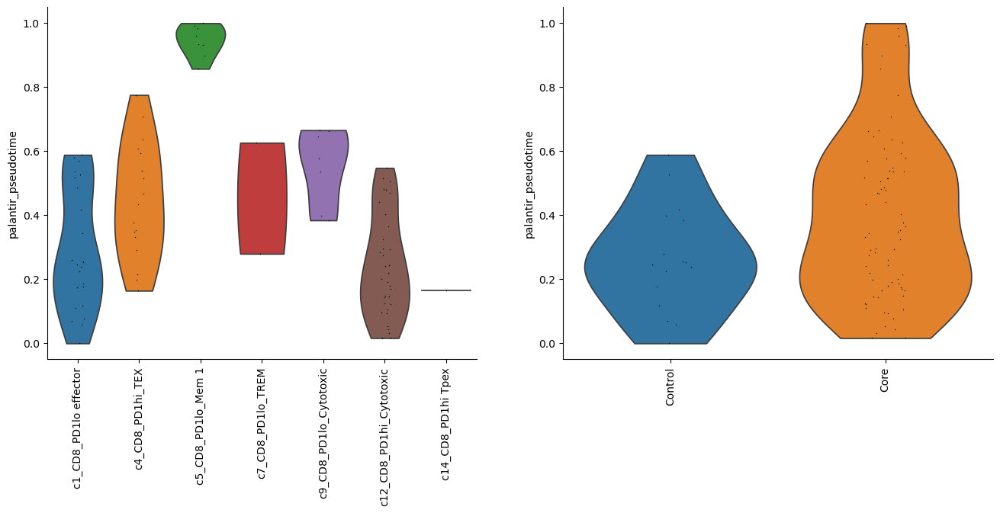

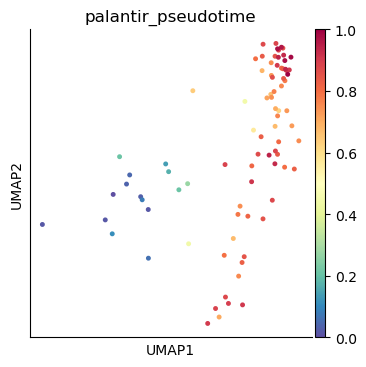

Found 2 trajectories


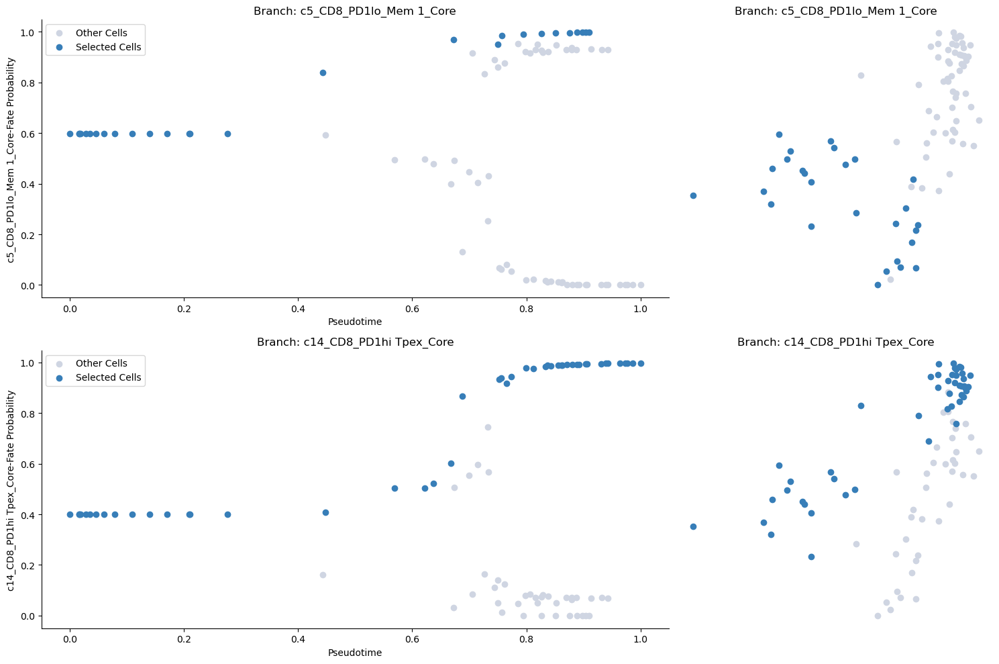

[2025-05-07 07:50:28,886] [INFO    ] Using non-sparse Gaussian Process since n_landmarks (50) >= n_samples (47) and rank = 1.0.
[2025-05-07 07:50:28,887] [INFO    ] Using covariance function Matern52(ls=0.5186917304992675).
[2025-05-07 07:50:28,910] [INFO    ] Recomputing covariance decomposition for predictive function.


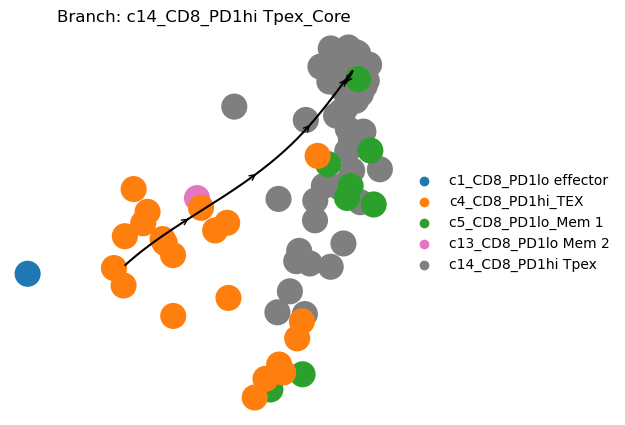

[2025-05-07 07:50:29,920] [INFO    ] Using non-sparse Gaussian Process since n_landmarks (50) >= n_samples (47) and rank = 1.0.
[2025-05-07 07:50:29,920] [INFO    ] Using covariance function Matern52(ls=0.5186917304992675).
[2025-05-07 07:50:29,921] [INFO    ] Recomputing covariance decomposition for predictive function.
[2025-05-07 07:50:29,944] [INFO    ] Using non-sparse Gaussian Process since n_landmarks (50) >= n_samples (27) and rank = 1.0.
[2025-05-07 07:50:29,945] [INFO    ] Using covariance function Matern52(ls=0.5186917304992675).
[2025-05-07 07:50:29,946] [INFO    ] Recomputing covariance decomposition for predictive function.


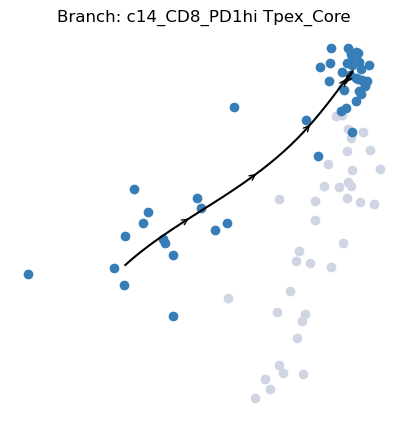

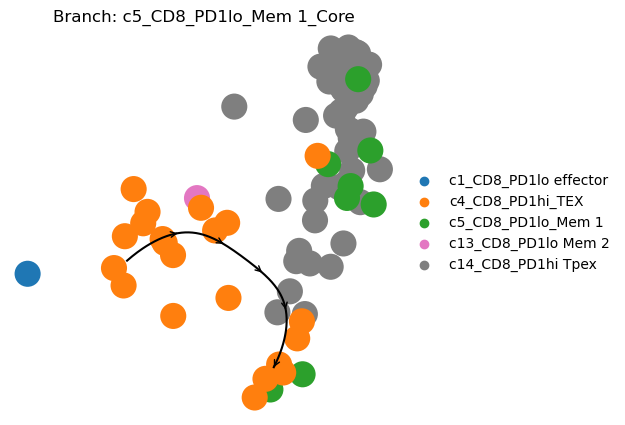

[2025-05-07 07:50:30,144] [INFO    ] Using non-sparse Gaussian Process since n_landmarks (50) >= n_samples (27) and rank = 1.0.
[2025-05-07 07:50:30,144] [INFO    ] Using covariance function Matern52(ls=0.5186917304992675).
[2025-05-07 07:50:30,145] [INFO    ] Recomputing covariance decomposition for predictive function.


/home/ubuntu/miniconda3/envs/barbu_env_cr/lib/python3.9/site-packages/scanpy/external/tl/_palantir.py:243: ImplicitModificationWarning: Setting element `.layers['palantir_imp']` of view, initializing view as actual.
  adata.layers["palantir_imp"] = imp_df


Falling back to slow early cell detection.
Sampling and flocking waypoints...
Time for determining waypoints: 0.000445707639058431 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...
Time for shortest paths: 0.1645740032196045 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 0.9997
Correlation at iteration 2: 0.9999
Entropy and branch probabilities...
Markov chain construction...
Identification of terminal states...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...
Using CTGAAGTAGACGCACA_LHCC45_Control_CD45 for cell type c1_CD8_PD1lo effector which is latest cell in c1_CD8_PD1lo effector when starting from GTGGGTCCAGCCTTTC_LHCC45_Core_CD45.
Sampling and flocking waypoints...
Time for determining waypoints: 0.00021981398264567058 minutes
Determining pseudotime...
Shortest path distances using 10-nearest neighbor graph...
Time for shortest paths: 0.0018862406412760416 minutes
Ite

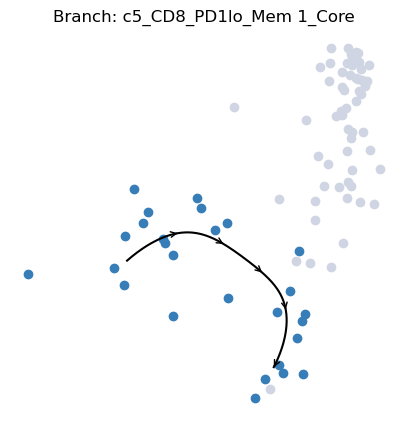

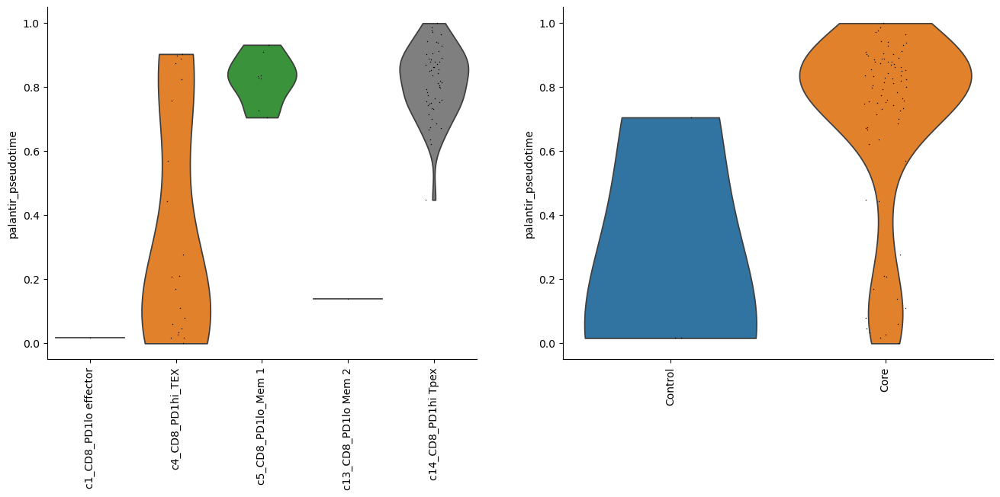

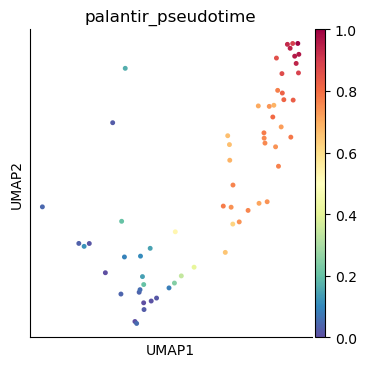

Found 2 trajectories


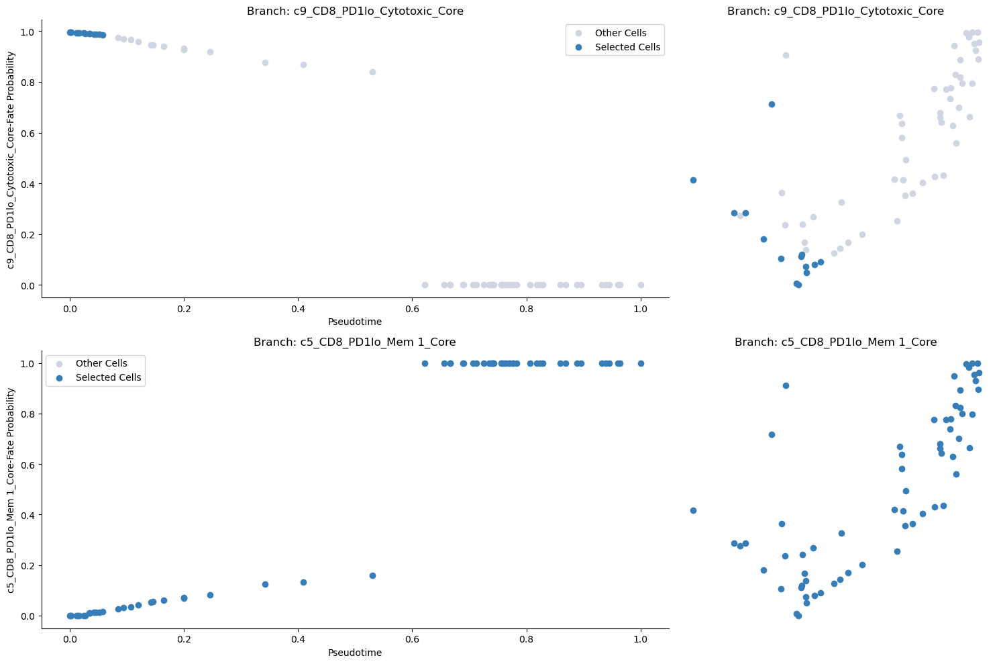

[2025-05-07 07:50:53,130] [INFO    ] Using non-sparse Gaussian Process since n_landmarks (50) >= n_samples (14) and rank = 1.0.
[2025-05-07 07:50:53,131] [INFO    ] Using covariance function Matern52(ls=0.6881357192993164).
[2025-05-07 07:50:53,132] [INFO    ] Recomputing covariance decomposition for predictive function.


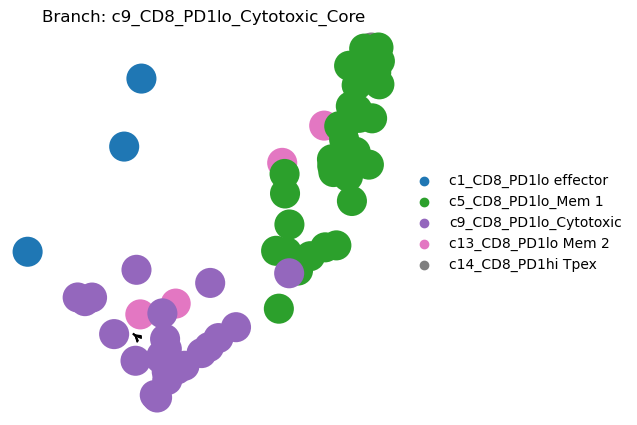

[2025-05-07 07:50:53,281] [INFO    ] Using non-sparse Gaussian Process since n_landmarks (50) >= n_samples (14) and rank = 1.0.
[2025-05-07 07:50:53,281] [INFO    ] Using covariance function Matern52(ls=0.6881357192993164).
[2025-05-07 07:50:53,282] [INFO    ] Recomputing covariance decomposition for predictive function.
[2025-05-07 07:50:53,330] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (64) and rank = 1.0.
[2025-05-07 07:50:53,331] [INFO    ] Using covariance function Matern52(ls=0.6881357192993164).
[2025-05-07 07:50:53,354] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-05-07 07:50:53,670] [INFO    ] Sigma interpreted as element-wise standard deviation.


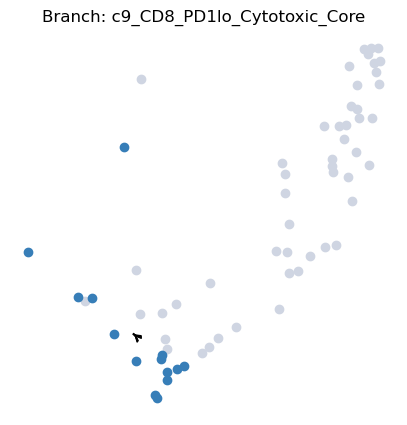

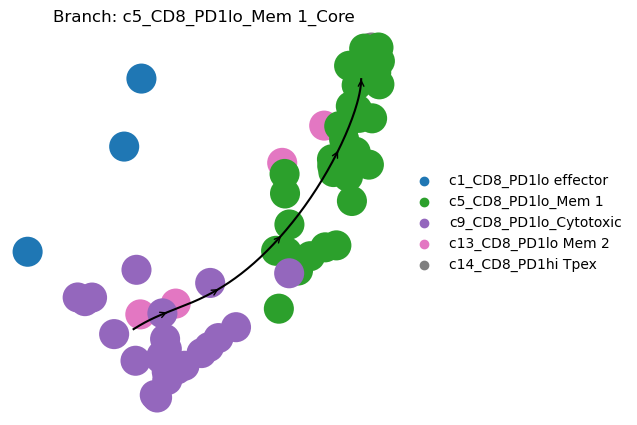

[2025-05-07 07:50:53,934] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (64) and rank = 1.0.
[2025-05-07 07:50:53,935] [INFO    ] Using covariance function Matern52(ls=0.6881357192993164).
[2025-05-07 07:50:53,936] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-05-07 07:50:53,949] [INFO    ] Sigma interpreted as element-wise standard deviation.


/home/ubuntu/miniconda3/envs/barbu_env_cr/lib/python3.9/site-packages/scanpy/external/tl/_palantir.py:243: ImplicitModificationWarning: Setting element `.layers['palantir_imp']` of view, initializing view as actual.
  adata.layers["palantir_imp"] = imp_df


Falling back to slow early cell detection.
Sampling and flocking waypoints...
Time for determining waypoints: 0.0004146695137023926 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...
Time for shortest paths: 0.1651391863822937 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 0.9993
Correlation at iteration 2: 0.9999
Correlation at iteration 3: 0.9999
Entropy and branch probabilities...
Markov chain construction...
Identification of terminal states...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...
Using TGACTAGGTGGTAACG_LHCC44_Control_CD45 for cell type c1_CD8_PD1lo effector which is latest cell in c1_CD8_PD1lo effector when starting from CCGTGGAGTTAGTGGG_LHCC44_Core_CD45.
Sampling and flocking waypoints...
Time for determining waypoints: 0.00020541747411092123 minutes
Determining pseudotime...
Shortest path distances using 9-nearest neighbor graph...
Time for shortest paths

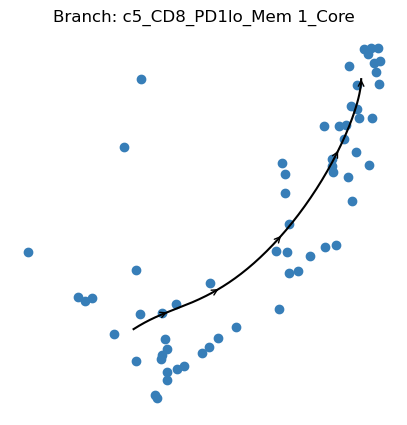

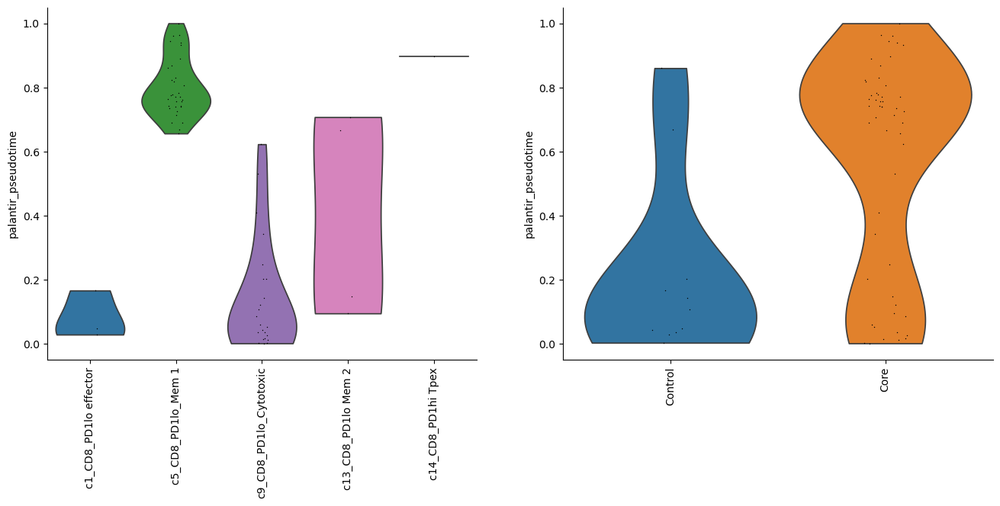

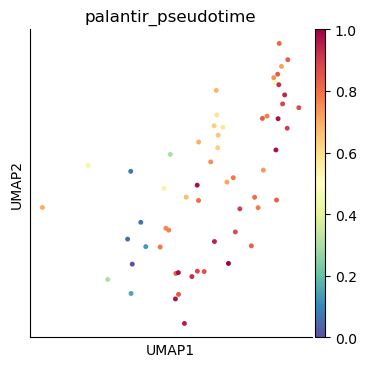

Found 1 trajectories


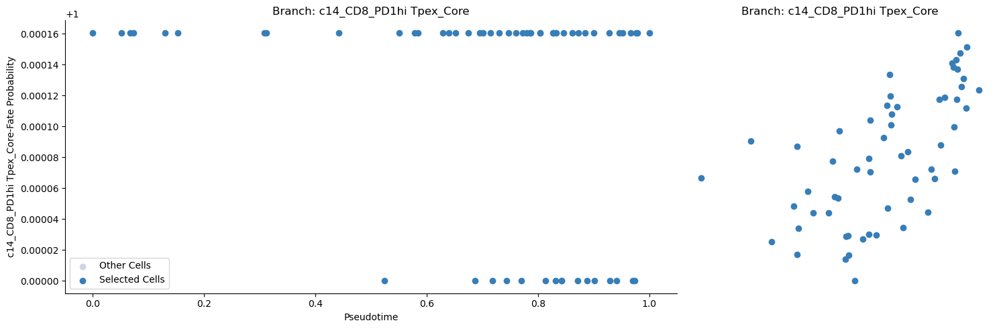

[2025-05-07 07:51:16,702] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (59) and rank = 1.0.
[2025-05-07 07:51:16,703] [INFO    ] Using covariance function Matern52(ls=0.5715827465057373).
[2025-05-07 07:51:16,727] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-05-07 07:51:17,054] [INFO    ] Sigma interpreted as element-wise standard deviation.


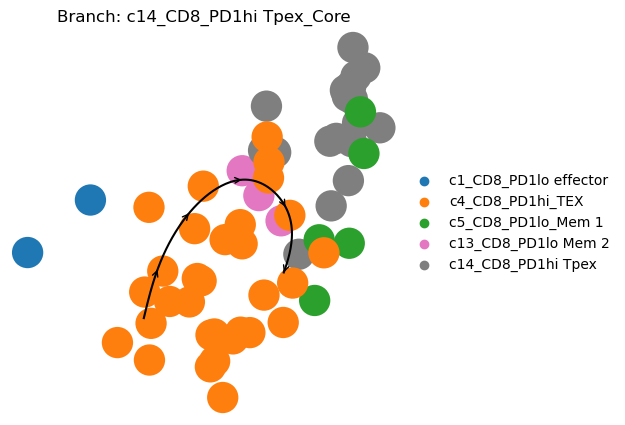

[2025-05-07 07:51:17,286] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (59) and rank = 1.0.
[2025-05-07 07:51:17,286] [INFO    ] Using covariance function Matern52(ls=0.5715827465057373).
[2025-05-07 07:51:17,287] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-05-07 07:51:17,300] [INFO    ] Sigma interpreted as element-wise standard deviation.


/home/ubuntu/miniconda3/envs/barbu_env_cr/lib/python3.9/site-packages/scanpy/external/tl/_palantir.py:243: ImplicitModificationWarning: Setting element `.layers['palantir_imp']` of view, initializing view as actual.
  adata.layers["palantir_imp"] = imp_df


No effectors in cluster


/home/ubuntu/miniconda3/envs/barbu_env_cr/lib/python3.9/site-packages/scanpy/external/tl/_palantir.py:243: ImplicitModificationWarning: Setting element `.layers['palantir_imp']` of view, initializing view as actual.
  adata.layers["palantir_imp"] = imp_df


Using CGTAGCGGTCCCTACT_LHCC40_Control_CD45 for cell type c1_CD8_PD1lo effector which is max in diffusion component 0.
Sampling and flocking waypoints...
Time for determining waypoints: 0.0001746376355489095 minutes
Determining pseudotime...
Shortest path distances using 9-nearest neighbor graph...
Time for shortest paths: 0.16201188961664836 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 0.9997
Correlation at iteration 2: 0.9999
Entropy and branch probabilities...
Markov chain construction...
Identification of terminal states...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...


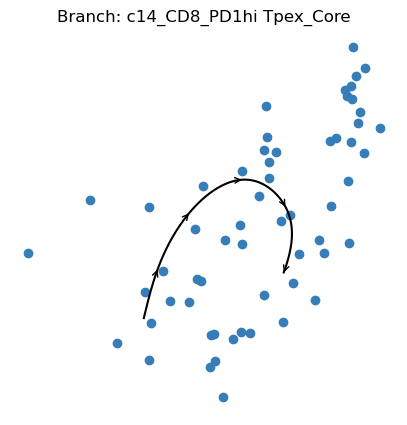

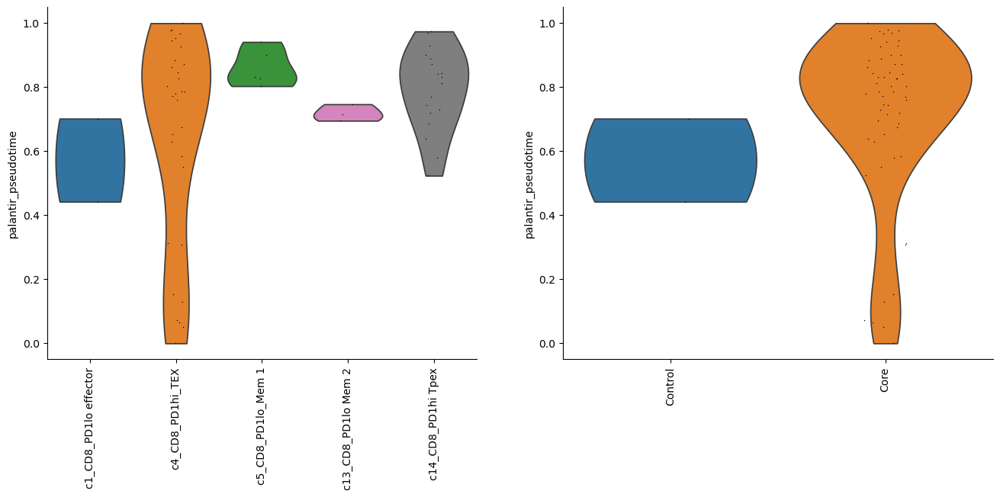

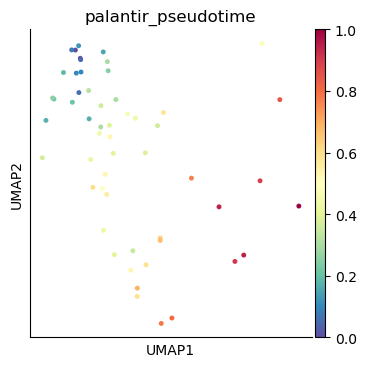

Found 1 trajectories


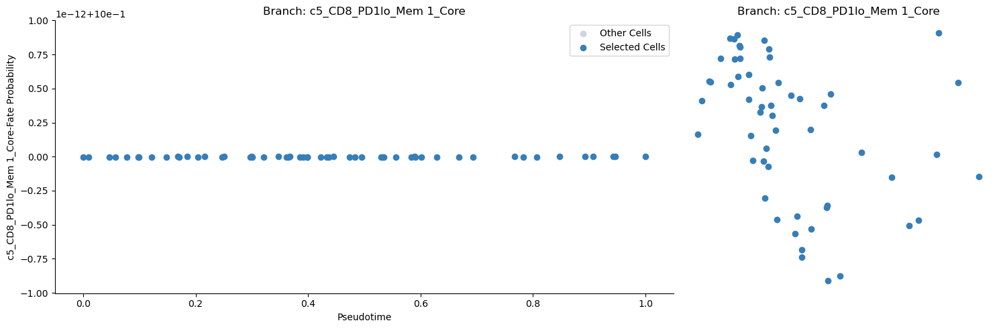

[2025-05-07 07:51:40,951] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (55) and rank = 1.0.
[2025-05-07 07:51:40,952] [INFO    ] Using covariance function Matern52(ls=0.6546695709228516).
[2025-05-07 07:51:40,953] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-05-07 07:51:40,969] [INFO    ] Sigma interpreted as element-wise standard deviation.


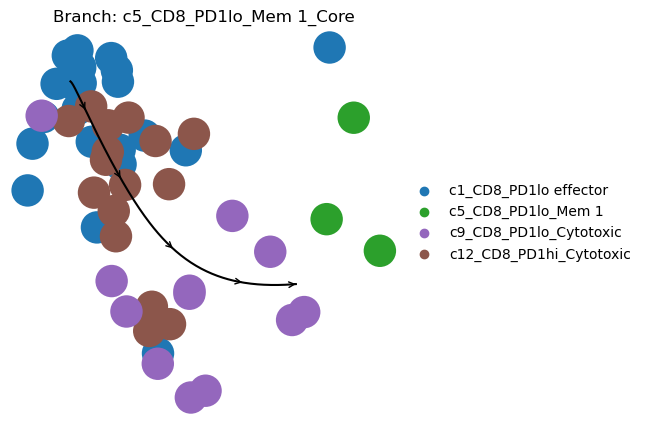

[2025-05-07 07:51:41,129] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (55) and rank = 1.0.
[2025-05-07 07:51:41,130] [INFO    ] Using covariance function Matern52(ls=0.6546695709228516).
[2025-05-07 07:51:41,130] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-05-07 07:51:41,144] [INFO    ] Sigma interpreted as element-wise standard deviation.


/home/ubuntu/miniconda3/envs/barbu_env_cr/lib/python3.9/site-packages/scanpy/external/tl/_palantir.py:243: ImplicitModificationWarning: Setting element `.layers['palantir_imp']` of view, initializing view as actual.
  adata.layers["palantir_imp"] = imp_df


No effectors in cluster


/home/ubuntu/miniconda3/envs/barbu_env_cr/lib/python3.9/site-packages/scanpy/external/tl/_palantir.py:243: ImplicitModificationWarning: Setting element `.layers['palantir_imp']` of view, initializing view as actual.
  adata.layers["palantir_imp"] = imp_df


No effectors in cluster


/home/ubuntu/miniconda3/envs/barbu_env_cr/lib/python3.9/site-packages/scanpy/external/tl/_palantir.py:243: ImplicitModificationWarning: Setting element `.layers['palantir_imp']` of view, initializing view as actual.
  adata.layers["palantir_imp"] = imp_df


Using CATATTCAGACCCACC_LHCC46_Rim_CD45 for cell type c1_CD8_PD1lo effector which is min in diffusion component 0.
Sampling and flocking waypoints...
Time for determining waypoints: 0.0001961827278137207 minutes
Determining pseudotime...
Shortest path distances using 7-nearest neighbor graph...
Time for shortest paths: 0.16318103075027465 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 0.9998
Correlation at iteration 2: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Identification of terminal states...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...


/home/ubuntu/miniconda3/envs/barbu_env_cr/lib/python3.9/site-packages/palantir/core.py:639: UserWarning: Singular matrix encountered. Attempting pseudo-inverse.
  warnings.warn(


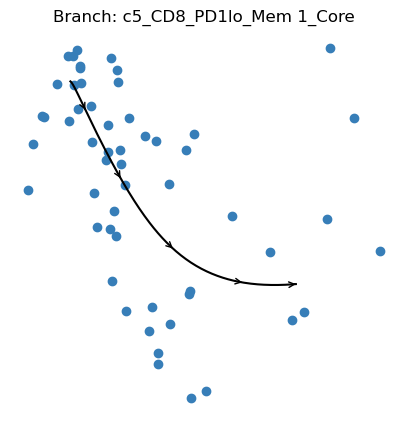

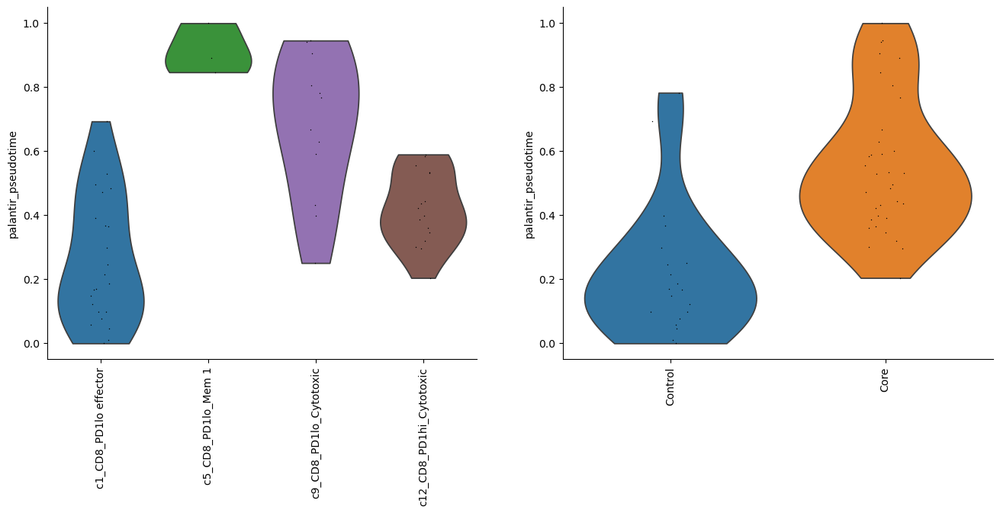

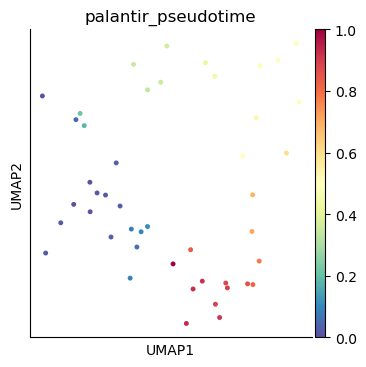

Found 1 trajectories


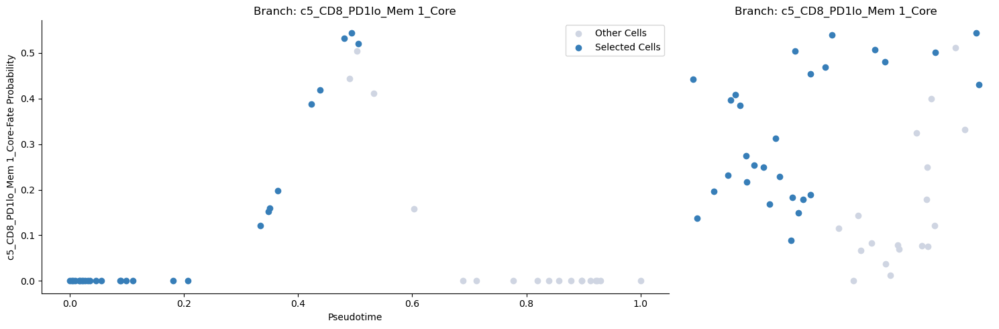

[2025-05-07 07:52:06,741] [INFO    ] Using non-sparse Gaussian Process since n_landmarks (50) >= n_samples (28) and rank = 1.0.
[2025-05-07 07:52:06,741] [INFO    ] Using covariance function Matern52(ls=0.46663103103637693).
[2025-05-07 07:52:06,766] [INFO    ] Recomputing covariance decomposition for predictive function.


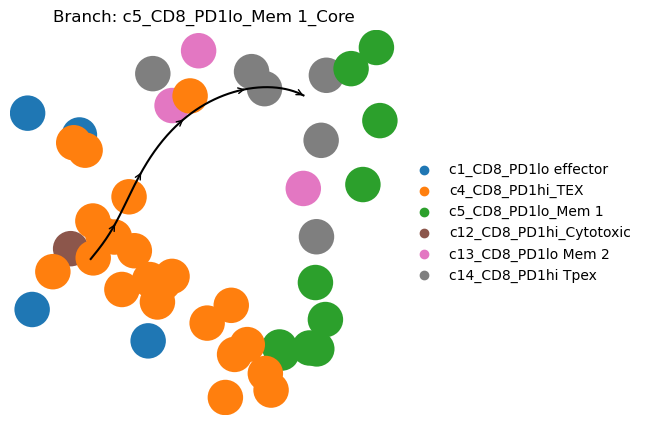

[2025-05-07 07:52:07,728] [INFO    ] Using non-sparse Gaussian Process since n_landmarks (50) >= n_samples (28) and rank = 1.0.
[2025-05-07 07:52:07,729] [INFO    ] Using covariance function Matern52(ls=0.46663103103637693).
[2025-05-07 07:52:07,730] [INFO    ] Recomputing covariance decomposition for predictive function.


/home/ubuntu/miniconda3/envs/barbu_env_cr/lib/python3.9/site-packages/scanpy/external/tl/_palantir.py:243: ImplicitModificationWarning: Setting element `.layers['palantir_imp']` of view, initializing view as actual.
  adata.layers["palantir_imp"] = imp_df


Using CGCTTCAAGAAACCAT_LHCC44_Control_CD45 for cell type c1_CD8_PD1lo effector which is min in diffusion component 0.
Sampling and flocking waypoints...
Time for determining waypoints: 0.00016699632008870441 minutes
Determining pseudotime...
Shortest path distances using 7-nearest neighbor graph...
Time for shortest paths: 0.16112267971038818 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 0.9996
Correlation at iteration 2: 0.9999
Entropy and branch probabilities...
Markov chain construction...
Identification of terminal states...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...


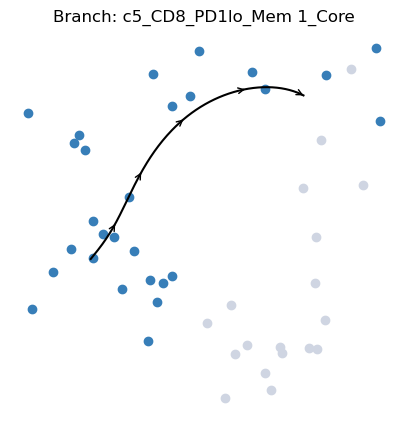

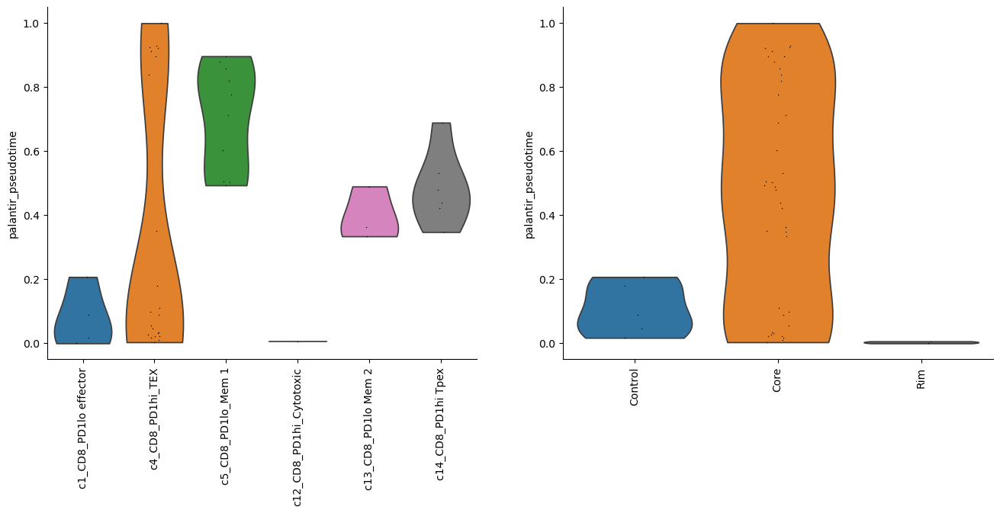

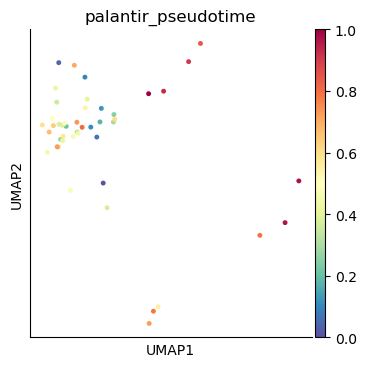

Found 4 trajectories


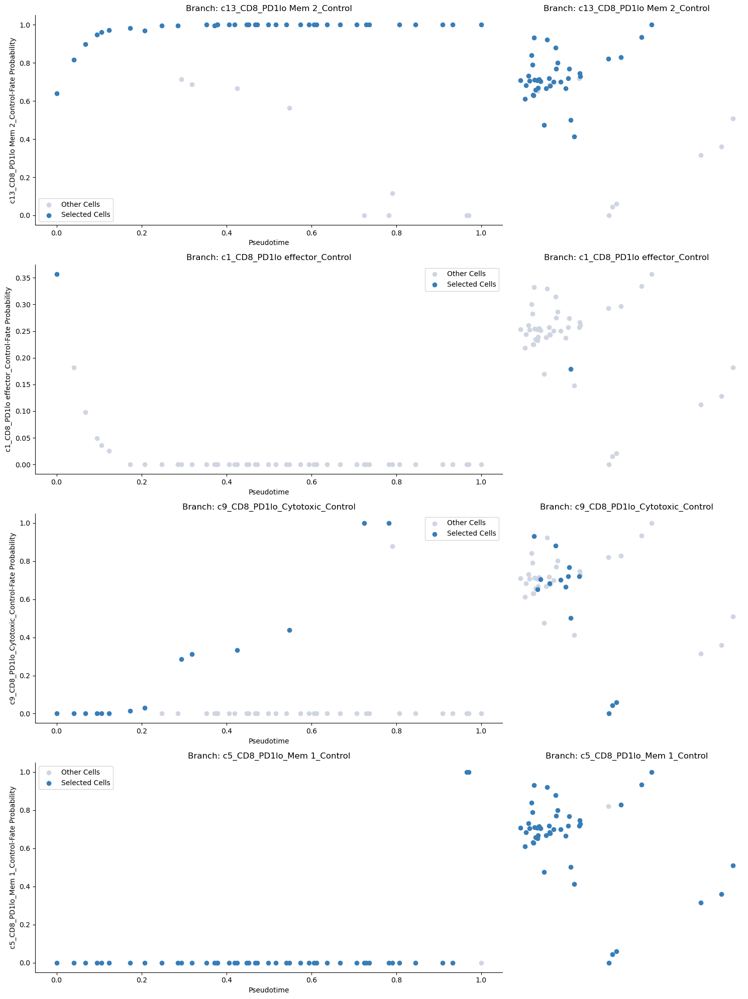

[2025-05-07 07:52:30,330] [INFO    ] Using non-sparse Gaussian Process since n_landmarks (50) >= n_samples (1) and rank = 1.0.
[2025-05-07 07:52:30,331] [INFO    ] Using covariance function Matern52(ls=0.7152791976928711).
[2025-05-07 07:52:30,332] [INFO    ] Recomputing covariance decomposition for predictive function.


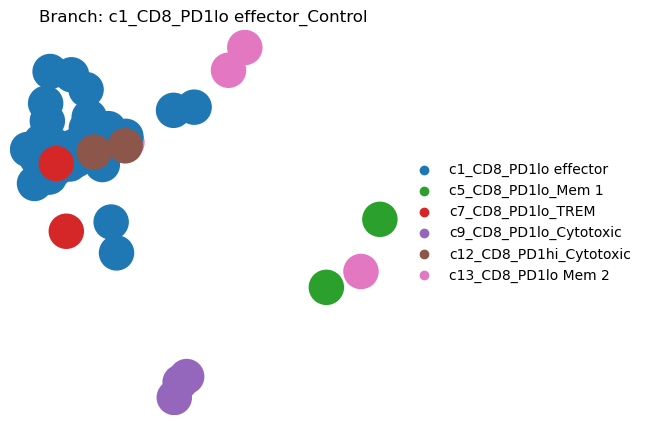

[2025-05-07 07:52:30,493] [INFO    ] Using non-sparse Gaussian Process since n_landmarks (50) >= n_samples (1) and rank = 1.0.
[2025-05-07 07:52:30,494] [INFO    ] Using covariance function Matern52(ls=0.7152791976928711).
[2025-05-07 07:52:30,495] [INFO    ] Recomputing covariance decomposition for predictive function.
[2025-05-07 07:52:30,515] [INFO    ] Using non-sparse Gaussian Process since n_landmarks (50) >= n_samples (45) and rank = 1.0.
[2025-05-07 07:52:30,515] [INFO    ] Using covariance function Matern52(ls=0.7152791976928711).
[2025-05-07 07:52:30,517] [INFO    ] Recomputing covariance decomposition for predictive function.


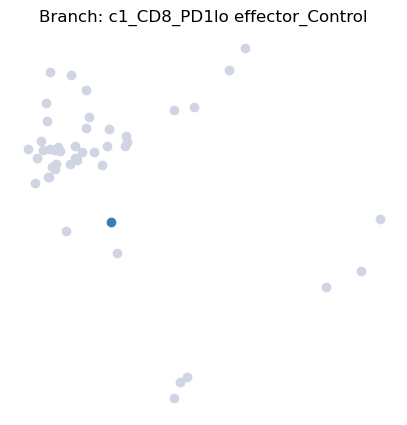

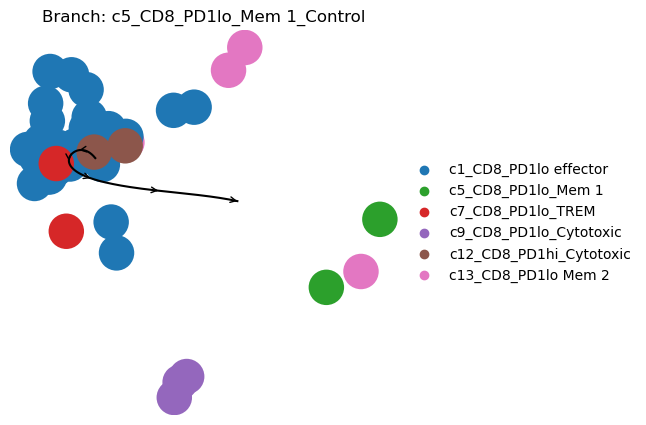

[2025-05-07 07:52:30,719] [INFO    ] Using non-sparse Gaussian Process since n_landmarks (50) >= n_samples (45) and rank = 1.0.
[2025-05-07 07:52:30,719] [INFO    ] Using covariance function Matern52(ls=0.7152791976928711).
[2025-05-07 07:52:30,720] [INFO    ] Recomputing covariance decomposition for predictive function.
[2025-05-07 07:52:30,769] [INFO    ] Using non-sparse Gaussian Process since n_landmarks (50) >= n_samples (37) and rank = 1.0.
[2025-05-07 07:52:30,770] [INFO    ] Using covariance function Matern52(ls=0.7152791976928711).
[2025-05-07 07:52:30,794] [INFO    ] Recomputing covariance decomposition for predictive function.


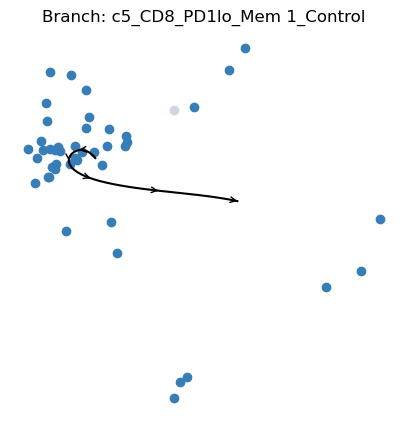

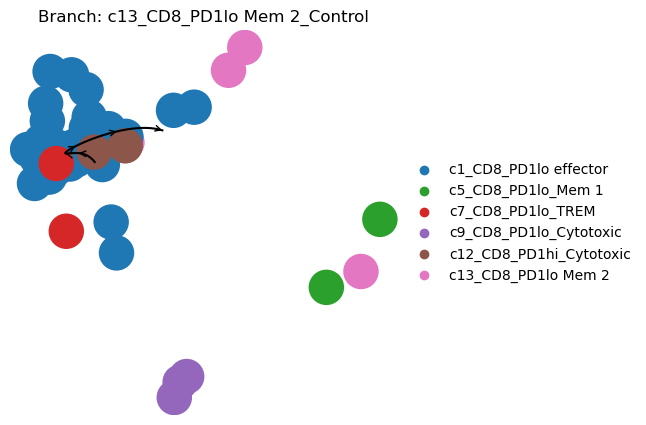

[2025-05-07 07:52:31,824] [INFO    ] Using non-sparse Gaussian Process since n_landmarks (50) >= n_samples (37) and rank = 1.0.
[2025-05-07 07:52:31,825] [INFO    ] Using covariance function Matern52(ls=0.7152791976928711).
[2025-05-07 07:52:31,826] [INFO    ] Recomputing covariance decomposition for predictive function.
[2025-05-07 07:52:31,846] [INFO    ] Using non-sparse Gaussian Process since n_landmarks (50) >= n_samples (14) and rank = 1.0.
[2025-05-07 07:52:31,847] [INFO    ] Using covariance function Matern52(ls=0.7152791976928711).
[2025-05-07 07:52:31,848] [INFO    ] Recomputing covariance decomposition for predictive function.


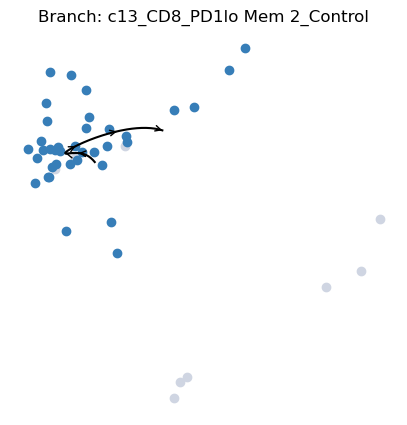

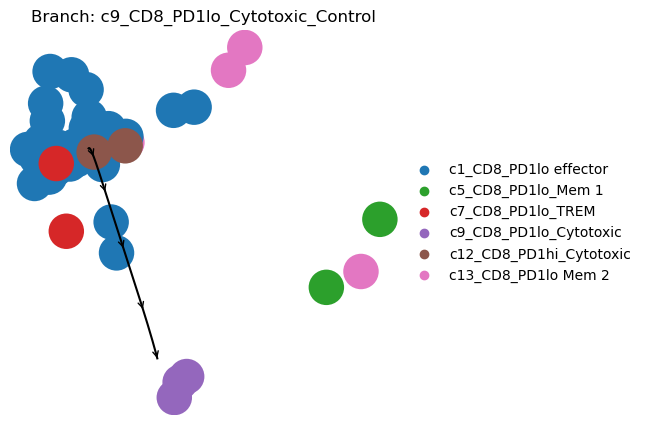

[2025-05-07 07:52:32,051] [INFO    ] Using non-sparse Gaussian Process since n_landmarks (50) >= n_samples (14) and rank = 1.0.
[2025-05-07 07:52:32,052] [INFO    ] Using covariance function Matern52(ls=0.7152791976928711).
[2025-05-07 07:52:32,053] [INFO    ] Recomputing covariance decomposition for predictive function.


/home/ubuntu/miniconda3/envs/barbu_env_cr/lib/python3.9/site-packages/scanpy/external/tl/_palantir.py:243: ImplicitModificationWarning: Setting element `.layers['palantir_imp']` of view, initializing view as actual.
  adata.layers["palantir_imp"] = imp_df


Using AAGCCGCAGTTCGCGC_LHCC45_Control_CD45 for cell type c1_CD8_PD1lo effector which is max in diffusion component 0.
Sampling and flocking waypoints...
Time for determining waypoints: 0.000166626771291097 minutes
Determining pseudotime...
Shortest path distances using 7-nearest neighbor graph...
Time for shortest paths: 0.16279151439666747 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 0.9992
Correlation at iteration 2: 0.9999
Correlation at iteration 3: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Identification of terminal states...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...


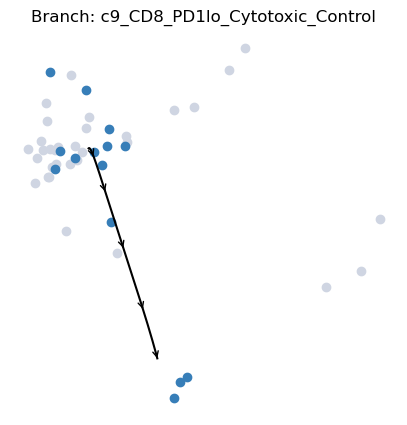

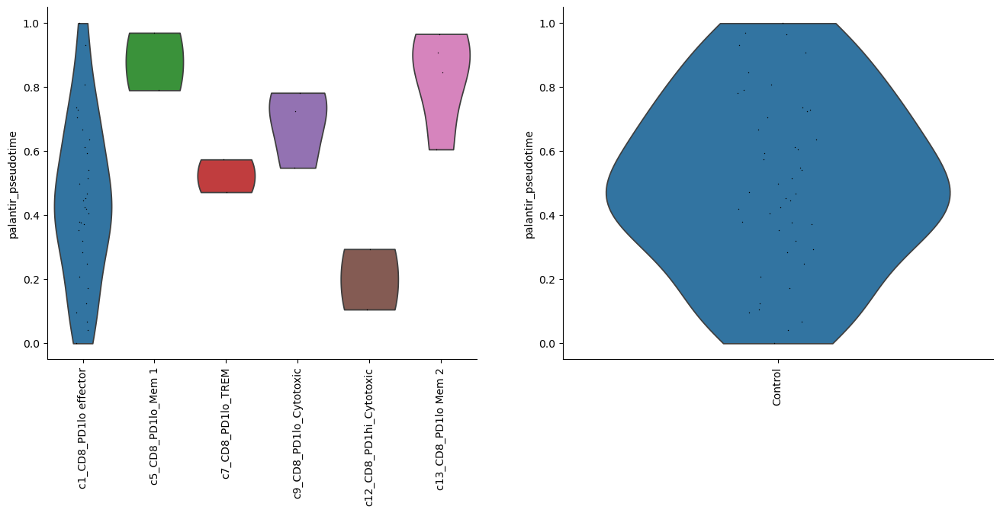

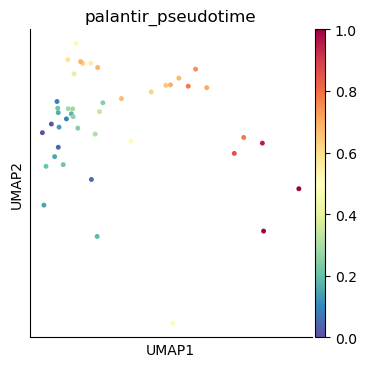

Found 4 trajectories


/home/ubuntu/miniconda3/envs/barbu_env_cr/lib/python3.9/site-packages/palantir/plot.py:906: UserWarning: Found only 2 fates in the intersection of 4 fate-probability fates in .obsm['palantir_fate_probabilities'] fates) and 4 fate-mask fates in .obsm['branch_masks'].
  warnings.warn(


TypeError: Indexing a Series with DataFrame is not supported, use the appropriate DataFrame column

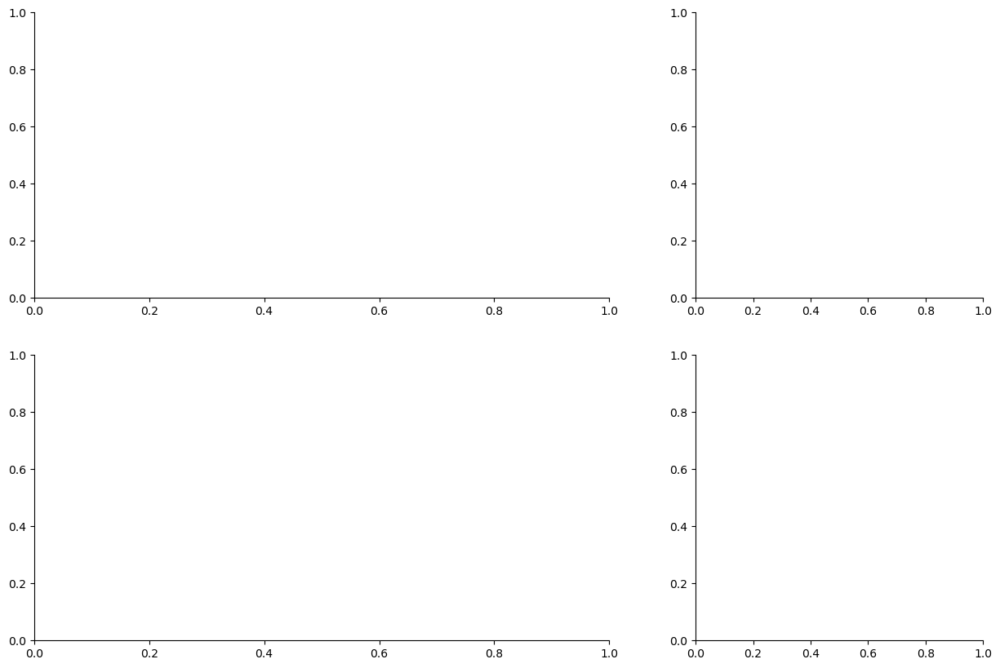

In [36]:
NORMALIZE_PST = False

top_clonal_counts = adata.obs["Clonotype cluster"].value_counts(ascending=False)[:30]
top_clonal_counts = top_clonal_counts[1:]  # skip 'X' - no clonotype
top_clonal_counts

adata.obs["Palantir pst indiviudal"] = pd.Series(
    [None] * len(adata.obs.index), index=adata.obs.index, dtype=np.float
)

processed = []
for clonotype in top_clonal_counts.index:
    pl_res = pst_analysis(
        adata,
        clonotype=clonotype,
        start_cluster="c1_CD8_PD1lo effector",
        plot=True,
        clonotype_column="Clonotype cluster",
    )

    if pl_res is None:
        print("No effectors in cluster")
    else:
        adata.obs.loc[pl_res.pseudotime.index, "Palantir pst indiviudal"] = (
            pl_res.pseudotime
        )
        # adata.obsm.loc[psts.index, "Palantir fate probs indiviudal"] = psts.pr_res.branch_probs
        processed.append(clonotype)

print(processed)

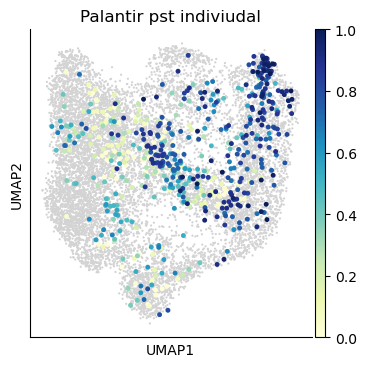

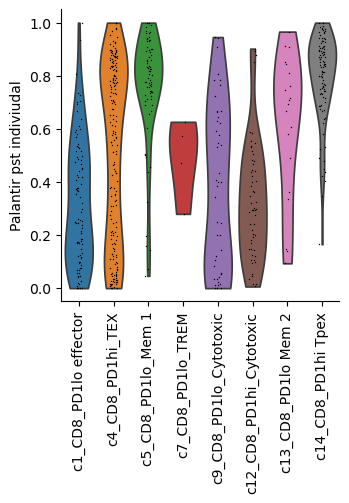

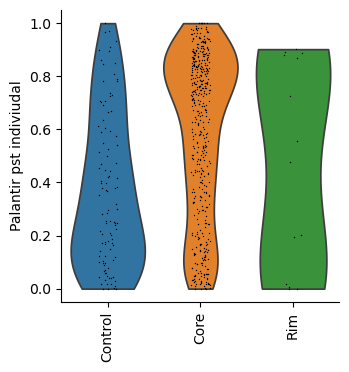

In [37]:
# Plot'

has_pst = adata.obs["Palantir pst indiviudal"].notnull()


size = [50 if x else 10 for x in has_pst]
scp.pl.umap(
    adata,
    color=["Palantir pst indiviudal"],
    size=size,
    cmap="YlGnBu",
    legend_loc="right margin",
    ncols=1,
)


scp.pl.violin(
    adata[has_pst],
    keys=["Palantir pst indiviudal"],
    groupby="Cluster label",
    rotation=90,
)

scp.pl.violin(
    adata[has_pst], keys=["Palantir pst indiviudal"], groupby="Tissue", rotation=90
)

In [38]:
cells_looked_at = 0
for clonotype in top_clonal_counts.index:
    cells_in_clono = adata[adata.obs["Clonotype cluster"] == clonotype]
    if "c1_CD8_PD1lo effector" in cells_in_clono.obs["Cluster label"].unique():

        cells_looked_at += len(cells_in_clono)
cells_looked_at

976

/home/ubuntu/miniconda3/envs/barbu_env_cr/lib/python3.9/site-packages/scanpy/external/tl/_palantir.py:243: ImplicitModificationWarning: Setting element `.layers['palantir_imp']` of view, initializing view as actual.
  adata.layers["palantir_imp"] = imp_df


Using TCATTACGTTGAACTC_LHCC54_Control_CD45 for cell type c9_CD8_PD1lo_Cytotoxic which is min in diffusion component 0.
Sampling and flocking waypoints...
Time for determining waypoints: 0.00016985336939493814 minutes
Determining pseudotime...
Shortest path distances using 8-nearest neighbor graph...
Time for shortest paths: 0.16220123767852784 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 0.9998
Correlation at iteration 2: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Identification of terminal states...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...


/home/ubuntu/miniconda3/envs/barbu_env_cr/lib/python3.9/site-packages/palantir/core.py:639: UserWarning: Singular matrix encountered. Attempting pseudo-inverse.
  warnings.warn(


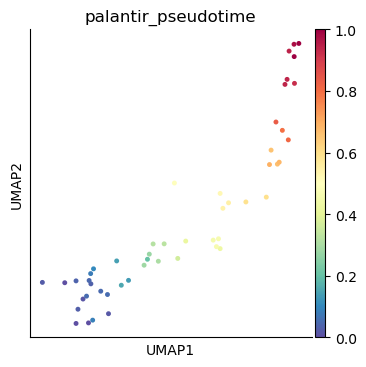

/home/ubuntu/miniconda3/envs/barbu_env_cr/lib/python3.9/site-packages/palantir/plot.py:906: UserWarning: Found only 2 fates in the intersection of 3 fate-probability fates in .obsm['palantir_fate_probabilities'] fates) and 3 fate-mask fates in .obsm['branch_masks'].
  warnings.warn(


Found 3 trajectories


TypeError: Indexing a Series with DataFrame is not supported, use the appropriate DataFrame column

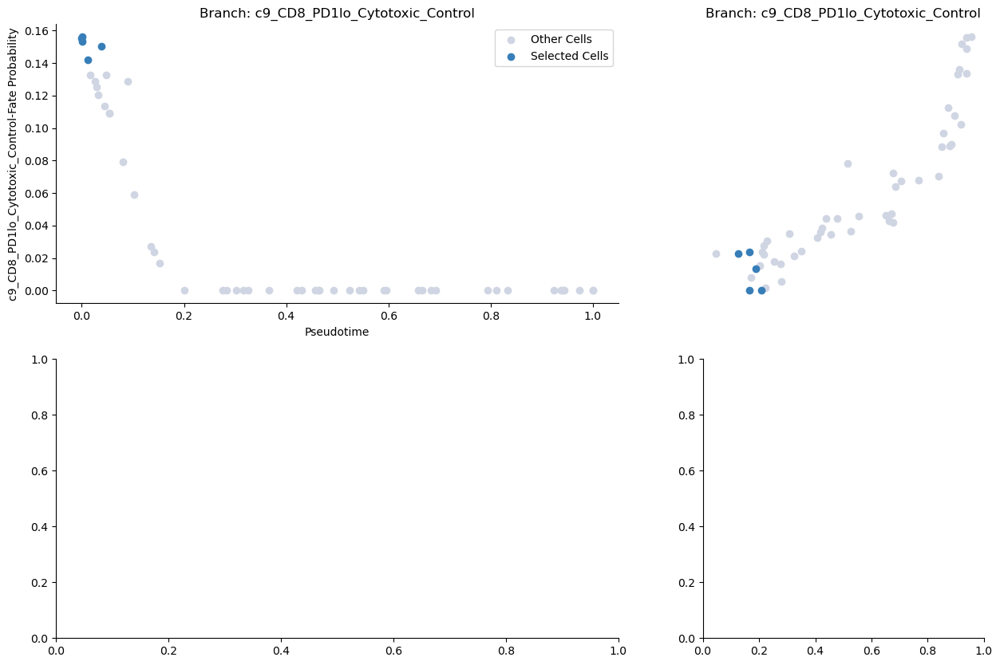

In [39]:
TPEX_CLUSTERS = ["843", "1028", "1121"]

top_clonal_counts = adata.obs["Clonotype cluster"].value_counts(ascending=False)[:30]
top_clonal_counts = top_clonal_counts[1:]  # skip 'X' - no clonotype
top_clonal_counts

adata.obs["Palantir pst indiviudal"] = pd.Series(
    [None] * len(adata.obs.index), index=adata.obs.index, dtype=np.float
)

processed = []
for clonotype in TPEX_CLUSTERS:
    pl_res = pst_analysis(
        adata,
        clonotype=clonotype,
        start_cluster="c9_CD8_PD1lo_Cytotoxic",
        plot=True,
        clonotype_column="Clonotype cluster",
    )

    if pl_res is None:
        print("No starting cells in clonotype cluster")
    else:
        adata.obs.loc[pl_res.pseudotime.index, "Palantir pst indiviudal"] = (
            pl_res.pseudotime
        )
        # adata.obsm.loc[psts.index, "Palantir fate probs indiviudal"] = psts.pr_res.branch_probs
        processed.append(clonotype)

print(processed)

In [ ]:
slingshot_pst = pd.read_csv("CD8_individual_slingshot_pseudotime_term_states_umap.csv")
slingshot_pst.set_index("new_index", inplace=True)

adata.obs.loc[slingshot_pst.index, "Slingshot pst indiviudal"] = slingshot_pst

has_pst = adata.obs["Slingshot pst indiviudal"].notnull()

size = [50 if x else 10 for x in has_pst]
scp.pl.umap(
    adata,
    color=["Slingshot pst indiviudal"],
    size=size,
    cmap="YlGnBu",
    legend_loc="right margin",
    ncols=1,
)

## Diff genes

In [6]:
# Load preprocessed adata
adata = scp.read("adata_CD8_velocity_diff_genes.h5ad")
print(adata.shape)

tcr_adata = scp.read("TCR_data.h5ad")
print(tcr_adata.shape)

# preprocess
# remove patient LHCC48
adata = adata[adata.obs.index[adata.obs.Patient != "LHCC48"]]

# add tcr clonotypes to main adata
adata.obs["Clonotype"] = pd.Categorical(
    [
        tcr_adata.obs.loc[idx]["clone_id"] if idx in tcr_adata.obs.index else "X"
        for idx, cell in adata.obs.iterrows()
    ]
)


# add tcr clonotype clusters to main adata
adata.obs["Clonotype cluster"] = pd.Categorical(
    [
        tcr_adata.obs.loc[idx]["cc_aa_tcrdist"] if idx in tcr_adata.obs.index else "X"
        for idx, cell in adata.obs.iterrows()
    ]
)

# add tcr clonotypes to main adata
adata.obs["Clonotype"] = pd.Categorical(
    [
        tcr_adata.obs.loc[idx]["clone_id"] if idx in tcr_adata.obs.index else "X"
        for idx, cell in adata.obs.iterrows()
    ]
)

(11766, 34)
(9247, 0)


/tmp/ipykernel_900843/3961849831.py:13: ImplicitModificationWarning: Trying to modify attribute `.obs` of view, initializing view as actual.
  adata.obs["Clonotype"] = pd.Categorical(


In [9]:
adata.obsm["X_pca"] = adata.obsm["X_pca_harmony"]

In [12]:
scp.external.tl.palantir(adata, n_components=5, knn=30)

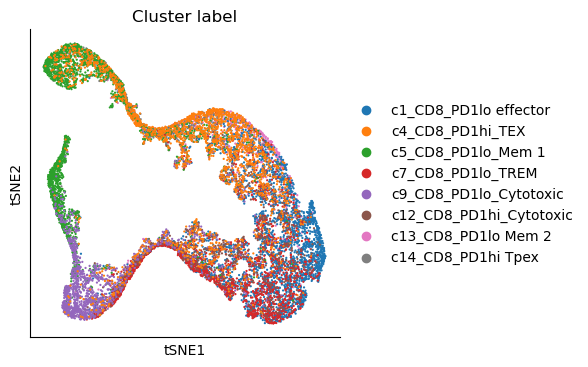

In [13]:
scp.tl.tsne(adata, n_pcs=2, use_rep="X_palantir_multiscale", perplexity=150)
scp.pl.tsne(adata, color="Cluster label")

In [29]:
##start_cell = np.argwhere(
#    (adata.obs["Cluster label"] == "c1_CD8_PD1lo effector").values
# ).flatten()[10]
dm_res = palantir.utils.run_diffusion_maps(adata, n_components=5, knn=30)

start_cell = palantir.utils.early_cell(
    adata,
    "c1_CD8_PD1lo effector",
    eigvec_key="DM_EigenVectors",
    celltype_column="Cluster label",
    fallback_seed=0,
)

pr_res = scp.external.tl.palantir_results(
    adata,
    early_cell=start_cell,
    ms_data="X_palantir_multiscale",
    num_waypoints=500,
)

Using CGCGGTACACACGCTG_LHCC45_Control_CD45 for cell type c1_CD8_PD1lo effector which is max in diffusion component 1.
Sampling and flocking waypoints...
Time for determining waypoints: 0.01718455155690511 minutes
Determining pseudotime...
Shortest path distances using 30-nearest neighbor graph...
Time for shortest paths: 0.22628809611002604 minutes
Iteratively refining the pseudotime...
Correlation at iteration 1: 0.9998
Correlation at iteration 2: 1.0000
Entropy and branch probabilities...
Markov chain construction...
Identification of terminal states...
Computing fundamental matrix and absorption probabilities...
Project results to all cells...


In [30]:
adata.obs["palantir_pseudotime"] = pr_res.pseudotime
adata.obsm["palantir_fate_probabilities"] = pr_res.branch_probs

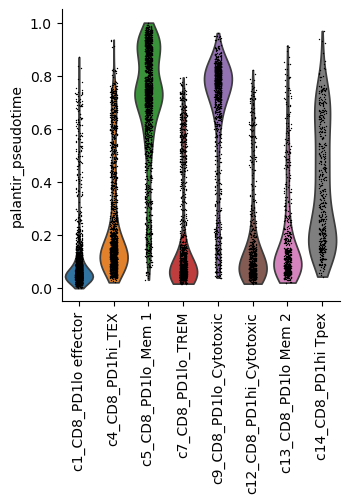

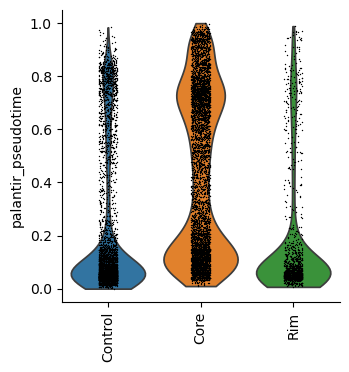

In [31]:
scp.pl.violin(adata, keys=["palantir_pseudotime"], groupby="Cluster label", rotation=90)

scp.pl.violin(adata, keys=["palantir_pseudotime"], groupby="Tissue", rotation=90)

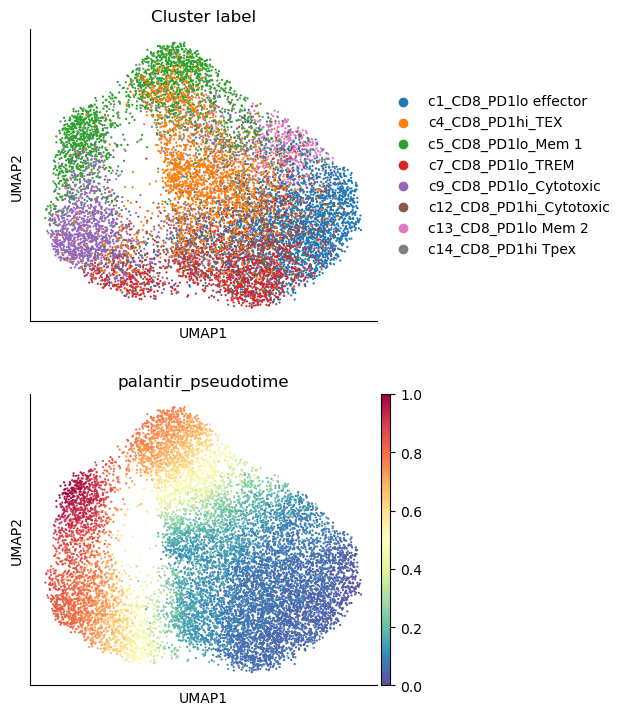

In [32]:
scp.pl.umap(adata, color=["Cluster label", "palantir_pseudotime"], ncols=1)

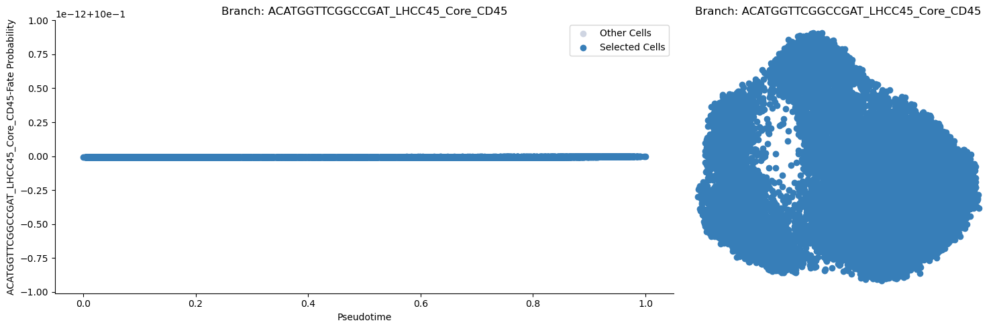

[2025-05-12 19:20:22,968] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (11,766) and rank = 1.0.
[2025-05-12 19:20:22,969] [INFO    ] Using covariance function Matern52(ls=0.7386490821838378).
[2025-05-12 19:20:22,989] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-05-12 19:20:23,877] [INFO    ] Sigma interpreted as element-wise standard deviation.


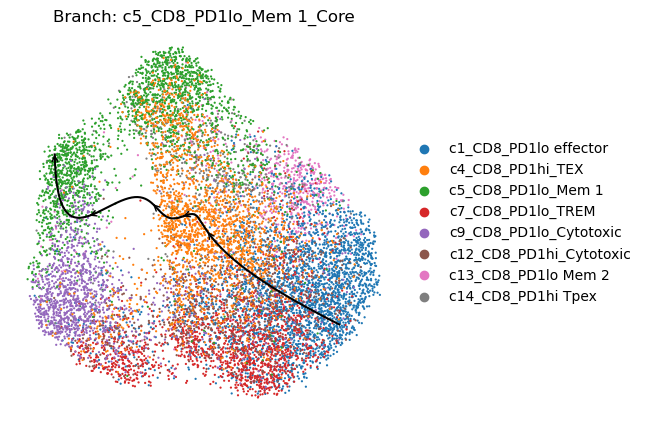

[2025-05-12 19:20:24,583] [INFO    ] Using sparse Gaussian Process since n_landmarks (50) < n_samples (11,766) and rank = 1.0.
[2025-05-12 19:20:24,583] [INFO    ] Using covariance function Matern52(ls=0.7386490821838378).
[2025-05-12 19:20:24,584] [INFO    ] Computing 50 landmarks with k-means clustering (random_state=42).
[2025-05-12 19:20:24,637] [INFO    ] Sigma interpreted as element-wise standard deviation.


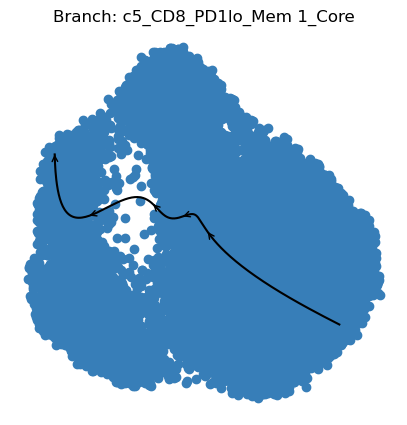

In [33]:
masks = palantir.presults.select_branch_cells(adata, q=0.01, eps=0.01)
palantir.plot.plot_branch_selection(adata)
plt.show()

traj_dict = {}
for trajectory in adata.obsm["branch_masks"].columns:
    traj_dict[trajectory] = (
        adata.obs.loc[trajectory]["Cluster label"]
        + "_"
        + adata.obs.loc[trajectory]["Tissue"]
    )

adata.obsm["branch_masks"].rename(
    columns=traj_dict,
    inplace=True,
)

adata.obsm["palantir_fate_probabilities"].rename(
    columns=traj_dict,
    inplace=True,
)

for trajectory in adata.obsm["branch_masks"].columns:
    palantir.plot.plot_trajectory(adata, trajectory, cell_color="Cluster label")

    plt.show()

    palantir.plot.plot_trajectory(adata, trajectory)
    plt.show